# Evaluation Project 9: Customer Churn Analysis

# Customer Churn Analysis is a classification based problem statement to predict and prevent attrition of customers, it strives to study and generate as many insights as as possible. The dataset includes customer data from IBM Sample Data Sets with the aim of building and comparing several customer churn prediction models. 

# Importing Data From Github repository dsrscientist/DSData/blob/master/Telecom_customer_churn.csv

# Importing Required Libraries And Data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
data=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/DSData/master/Telecom_customer_churn.csv',parse_dates=True)
data

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


# The above table represents first five and last five rows of the dataset.

In [2]:
# Observation 1
shape_of_data=data.shape
print('Number Of Rows: ',shape_of_data[0], 'Number Of Columns: ', shape_of_data[1])

Number Of Rows:  7043 Number Of Columns:  21


# Data Cleaning

In [3]:
data.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

# The above cell generates all the column names in the dataset

In [4]:
print('Type of storage of data ', type(data), '\nType of data series ', type(data.columns))

Type of storage of data  <class 'pandas.core.frame.DataFrame'> 
Type of data series  <class 'pandas.core.indexes.base.Index'>


In [5]:
data.isna().any()

customerID          False
gender              False
SeniorCitizen       False
Partner             False
Dependents          False
tenure              False
PhoneService        False
MultipleLines       False
InternetService     False
OnlineSecurity      False
OnlineBackup        False
DeviceProtection    False
TechSupport         False
StreamingTV         False
StreamingMovies     False
Contract            False
PaperlessBilling    False
PaymentMethod       False
MonthlyCharges      False
TotalCharges        False
Churn               False
dtype: bool

In [6]:
data.isna().values.any()

False

In [7]:
data.isnull().values.sum()

0

In [8]:
data.dtypes, len(data.dtypes)

(customerID           object
 gender               object
 SeniorCitizen         int64
 Partner              object
 Dependents           object
 tenure                int64
 PhoneService         object
 MultipleLines        object
 InternetService      object
 OnlineSecurity       object
 OnlineBackup         object
 DeviceProtection     object
 TechSupport          object
 StreamingTV          object
 StreamingMovies      object
 Contract             object
 PaperlessBilling     object
 PaymentMethod        object
 MonthlyCharges      float64
 TotalCharges         object
 Churn                object
 dtype: object,
 21)

# Tabulated Conclusion Of Data Cleaning

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


# Verbal Translation Of Conclusion Of Above Data Cleaning Process

# Conclusion:
1. The dataset has no missing values, therefore imputation and filling data are not required.
2. The whole dataset is of 7043 rows * 21 columns, hence, chances of overfitting, that is, model getting trained more than essential are high so we will go through the data thoroughly and try to draw anomalies and code some derived features, that can be of help in making predictions.
3. There are 3 continuous columns and 18 categorical columns, hence, encoding is required.

# Dataset Visualization                                                                                                     

# Head View

In [10]:
data.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


# The above table represents first five rows of original dataset

# Sample View

In [11]:
data.sample()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
3348,2172-EJXVF,Female,1,No,No,71,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Electronic check,105.9,7521.95,No


# The above table represents a random row as sample row from the dataset

# Tail View

In [12]:
data.tail()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes
7042,3186-AJIEK,Male,0,No,No,66,Yes,No,Fiber optic,Yes,...,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),105.65,6844.5,No


# The above table represents last five rows of the dataframe.

# EDA

In [14]:
import plotly.express as px
for x in data.select_dtypes(object).columns:
    if x=='customerID' or x=='TotalCharges':
        fig = px.bar(data, y=x)
        fig.show()
    else:
        fig=px.pie(data,x,title=x)
        fig.show()

# Tabulated Analysis Of Above Countplots

In [15]:
object_description=data.select_dtypes(object).describe()
object_description=object_description.rename(index={'count':'count of values', 'unique':'unique values', 'top':'most frequent value', 'freq':'frequency of most frequent value'})
dict1=object_description.iloc[0,:]-object_description.iloc[3,:]
object_description1=pd.concat([object_description, pd.DataFrame(dict1).T])
object_description1=object_description1.rename(index={0:'count of remaining values'})
object_description1

,customerID,gender,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,TotalCharges,Churn
count of values,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043
unique values,7043,2,2,2,2,3,3,3,3,3,3,3,3,3,2,4,6531,2
most frequent value,7590-VHVEG,Male,No,No,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,,No
frequency of most frequent value,1,3555,3641,4933,6361,3390,3096,3498,3088,3095,3473,2810,2785,3875,4171,2365,11,5174
count of remaining values,7042,3488,3402,2110,682,3653,3947,3545,3955,3948,3570,4233,4258,3168,2872,4678,7032,1869


# Verbal Translation Of Above Table

# Unique Values Of All Columns With Object Values (Exclusing Loan Id, that has all unique values)

In [16]:
colist=data.select_dtypes(object).columns
len(colist)

18

In [17]:
for x in range(len(colist)):
    print(colist[x],data[colist[x]].unique())

customerID ['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']
gender ['Female' 'Male']
Partner ['Yes' 'No']
Dependents ['No' 'Yes']
PhoneService ['No' 'Yes']
MultipleLines ['No phone service' 'No' 'Yes']
InternetService ['DSL' 'Fiber optic' 'No']
OnlineSecurity ['No' 'Yes' 'No internet service']
OnlineBackup ['Yes' 'No' 'No internet service']
DeviceProtection ['No' 'Yes' 'No internet service']
TechSupport ['No' 'Yes' 'No internet service']
StreamingTV ['No' 'Yes' 'No internet service']
StreamingMovies ['No' 'Yes' 'No internet service']
Contract ['Month-to-month' 'One year' 'Two year']
PaperlessBilling ['Yes' 'No']
PaymentMethod ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
TotalCharges ['29.85' '1889.5' '108.15' ... '346.45' '306.6' '6844.5']
Churn ['No' 'Yes']


# 1. There are 18 object columns, of which 5 are spread across yes and no:
    i. Partner has 3641 No Values (51.7%) and 3402 Yes Values.

    ii. 4933 are not dependents (70%) and 2110 are dependents.

    iii. 6361 have phone service (90.3%) and 682 do not have phone service.
    
    iv. 4171 choose paperless billing and 2872 paper billing.
    
    v. 5174 are not prone to attrition and 1869 are prone to attrition.

# Apart from these, remaining 12 columns have more than 2 unique values and are arranged in cell above and 1 column has 2 unique apart from Yes and No:
    Rows 3, 4 and 5 explain the most frequent value and its count and data portion occupied by other unique values.

 ## For example, there are 7043 unique customer id and each appears once; Indicating  that customer base comprises 7043 customers. 
    
##  There are 12 unique charges. Maximum charge is 999.9 that appeared once for 9093-FPDLG who is a female fiber optic customer.
    
##  Maximum people pay 20.20 that appeared 6531 times.
    
#  We will understand the data by drawing anomalies and understanding their buying habits:
    
1. More than 50% customers are male, that means focusing more on men's section can increase sales and customer loyalty, example, sports channels.

2. Majority are not dependents, hence, adult section and office items sections shaould have more attendants and variety. (partner 51.7% no), example, laying less stress on child protection on web and television, etcetera.

3. Area seems to be developed with dominannce of latest technology:

    i. 90.3% people have phone service; they should be educated more anout recent telecom handsets and facilities offered by companies to their existing customers for advancement to newer technology, such as, cordless phone, multiple lines, etcetera.

    ii. 42.2% people have multiple lines.
    
    iii. 44% people have fiber internet connection and 34.4% people have DSL Internet Connection; DSL customers should be educated more about fiber advantages and billing benefits for fiber customers. So that they have happier customer experience.
    
    iv. 28.7% people have online security.
    
    v. 34.5% people have online backup.
    
    vi. 34.4% people have device protection.
    
    vii. 29% people have tech support.
    
    viii. 38.4% people have streaming tv; Netflix and youtube premium should be promoted.
    
    viiii. 55% people have month to month contract.
    
    ix. 73.5% customers are not prone to attrition. 
    
    x. 59.2 % opt for paperless billing; more people should be attracted to paperless billing for building a greener nation by saving paper. They should be made more aware of charge benefits for paperless billing.
    
    xi. Dominant payment method is mailed check.
    
# Q&A Answered

### How many customers are being surveyed: 7043

### What billing methods are available: Paper and PaperLess

### How many and what payment methods are available: 4; Electronic Check, Mailed Check, Bank Transfer (Automatic) and Credit Card (Automatic).

# Tabulated Conclusion Of Data Cleaning

In [25]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


# Verbal Translation Of Conclusion Of Above Data Cleaning Process

# Conclusion:
### The dataset has no missing values, therefore imputation and filling data are not required.
### The whole dataset is of  7043 rows*21 columns, hence, chances of overfitting, that is, model getting trained more than essential are high so we will go through the data thoroughly and try to draw anomalies and code some derived features, that can be of help in making predictions.
### There are 3 continuous columns and 18 categorical columns, hence, encoding is not required.

# Feature Engineering

# Encoding

In [26]:
data.select_dtypes(object).columns

Index(['customerID', 'gender', 'Partner', 'Dependents', 'PhoneService',
       'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'Contract', 'PaperlessBilling', 'PaymentMethod', 'TotalCharges',
       'Churn'],
      dtype='object')

# Encoding Of All Other Object Columns With Ordinal Encoder (8 such columns)

In [27]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
# transform data
result = encoder.fit_transform(data.select_dtypes(include = [object]))
encoded_data=pd.DataFrame(data=result, columns=data.select_dtypes(include = [object]).columns+'_'+'encoded')
encoded_data

,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,OnlineSecurity_encoded,OnlineBackup_encoded,DeviceProtection_encoded,TechSupport_encoded,StreamingTV_encoded,StreamingMovies_encoded,Contract_encoded,PaperlessBilling_encoded,PaymentMethod_encoded,TotalCharges_encoded,Churn_encoded
0,5375.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2505.0,0.0
1,3962.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,3.0,1466.0,0.0
2,2564.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,157.0,1.0
3,5535.0,1.0,0.0,0.0,0.0,1.0,0.0,2.0,0.0,2.0,2.0,0.0,0.0,1.0,0.0,0.0,1400.0,0.0
4,6511.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,925.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,4853.0,1.0,1.0,1.0,1.0,2.0,0.0,2.0,0.0,2.0,2.0,2.0,2.0,1.0,1.0,3.0,1597.0,0.0
7039,1525.0,0.0,1.0,1.0,1.0,2.0,1.0,0.0,2.0,2.0,0.0,2.0,2.0,1.0,1.0,1.0,5698.0,0.0
7040,3367.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2994.0,0.0
7041,5934.0,1.0,1.0,0.0,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,2660.0,1.0


# Comparison Of Encoded Column And Original Column ('Loan Status')

In [28]:
encoded_data['Churn_encoded'].unique()

array([0., 1.])

In [29]:
data['Churn'].unique()

array(['No', 'Yes'], dtype=object)

# Conclusion
Yes is encoded as 1 and No is encoded as 0.

# Concatenating Encoded Data With Original Data

In [30]:
data=pd.concat([data, encoded_data], axis=1, ignore_index=False)
data=data.fillna(0)
data=data.drop(data.select_dtypes(object).columns, axis=1)
data.head()

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineBackup_encoded,DeviceProtection_encoded,TechSupport_encoded,StreamingTV_encoded,StreamingMovies_encoded,Contract_encoded,PaperlessBilling_encoded,PaymentMethod_encoded,TotalCharges_encoded,Churn_encoded
0,0,1,29.85,5375.0,0.0,1.0,0.0,0.0,1.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2505.0,0.0
1,0,34,56.95,3962.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,2.0,0.0,0.0,0.0,1.0,0.0,3.0,1466.0,0.0
2,0,2,53.85,2564.0,1.0,0.0,0.0,1.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,157.0,1.0
3,0,45,42.30,5535.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,2.0,2.0,0.0,0.0,1.0,0.0,0.0,1400.0,0.0
4,0,2,70.70,6511.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,925.0,1.0


In [31]:
data1=data.pct_change()
data1=data1.fillna(0)
data1=data1.applymap(lambda x: 1 if x == np.inf else x)
data1.columns=data1.columns+'_pct_change'
data1

,SeniorCitizen_pct_change,tenure_pct_change,MonthlyCharges_pct_change,customerID_encoded_pct_change,gender_encoded_pct_change,Partner_encoded_pct_change,Dependents_encoded_pct_change,PhoneService_encoded_pct_change,MultipleLines_encoded_pct_change,InternetService_encoded_pct_change,...,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change,Churn_encoded_pct_change
0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
1,0.0,33.000000,0.907873,-0.262884,1.0,-1.0,0.0,1.0,-1.0,0.0,...,-1.0,1.0,0.0,0.0,0.0,1.0,-1.0,0.500000,-0.414770,0.0
2,0.0,-0.941176,-0.054434,-0.352852,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,-1.0,0.0,0.0,0.0,-1.0,1.0,0.000000,-0.892906,1.0
3,0.0,21.500000,-0.214485,1.158736,0.0,0.0,0.0,-1.0,1.0,0.0,...,-1.0,1.0,1.0,0.0,0.0,1.0,-1.0,-1.000000,7.917197,-1.0
4,0.0,-0.955556,0.671395,0.176332,-1.0,0.0,0.0,1.0,-1.0,1.0,...,0.0,-1.0,-1.0,0.0,0.0,-1.0,1.0,1.000000,-0.339286,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0.0,-0.666667,3.009456,1.760523,1.0,1.0,1.0,0.0,1.0,-1.0,...,-1.0,1.0,1.0,1.0,1.0,-0.5,0.0,1.000000,1.074026,0.0
7039,0.0,2.000000,0.216981,-0.685761,-1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,-0.666667,2.567940,0.0
7040,0.0,-0.847222,-0.713178,1.207869,0.0,0.0,0.0,-1.0,-0.5,-1.0,...,-1.0,-1.0,0.0,-1.0,-1.0,-1.0,0.0,1.000000,-0.474552,0.0
7041,1.0,-0.636364,1.513514,0.762400,1.0,0.0,-1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.500000,-0.111556,1.0


In [32]:
data=pd.concat([data, data1], axis=1)
data

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change,Churn_encoded_pct_change
0,0,1,29.85,5375.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
1,0,34,56.95,3962.0,1.0,0.0,0.0,1.0,0.0,0.0,...,-1.0,1.0,0.0,0.0,0.0,1.0,-1.0,0.500000,-0.414770,0.0
2,0,2,53.85,2564.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,-1.0,0.0,0.0,0.0,-1.0,1.0,0.000000,-0.892906,1.0
3,0,45,42.30,5535.0,1.0,0.0,0.0,0.0,1.0,0.0,...,-1.0,1.0,1.0,0.0,0.0,1.0,-1.0,-1.000000,7.917197,-1.0
4,0,2,70.70,6511.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,-1.0,-1.0,0.0,0.0,-1.0,1.0,1.000000,-0.339286,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,24,84.80,4853.0,1.0,1.0,1.0,1.0,2.0,0.0,...,-1.0,1.0,1.0,1.0,1.0,-0.5,0.0,1.000000,1.074026,0.0
7039,0,72,103.20,1525.0,0.0,1.0,1.0,1.0,2.0,1.0,...,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,-0.666667,2.567940,0.0
7040,0,11,29.60,3367.0,0.0,1.0,1.0,0.0,1.0,0.0,...,-1.0,-1.0,0.0,-1.0,-1.0,-1.0,0.0,1.000000,-0.474552,0.0
7041,1,4,74.40,5934.0,1.0,1.0,0.0,1.0,2.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.500000,-0.111556,1.0


# Saving a copy of dataframe as final_dataframe that will be used further and data will be kept as storage of encoded and raw data.

In [33]:
final_dataframe=data.copy()

In [34]:
final_dataframe.isna().values.any()

False

In [35]:
final_dataframe=final_dataframe.fillna(0)
final_dataframe.isna().values.any()

False

In [36]:
final_dataframe[np.isinf(final_dataframe)] = 0

# There are no null and missing values in final dataframe.

# EDA Part 1

In [37]:
final_dataframe[:10]

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change,Churn_encoded_pct_change
0,0,1,29.85,5375.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
1,0,34,56.95,3962.0,1.0,0.0,0.0,1.0,0.0,0.0,...,-1.0,1.0,0.0,0.0,0.0,1.0,-1.0,0.500000,-0.414770,0.0
2,0,2,53.85,2564.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,-1.0,0.0,0.0,0.0,-1.0,1.0,0.000000,-0.892906,1.0
3,0,45,42.30,5535.0,1.0,0.0,0.0,0.0,1.0,0.0,...,-1.0,1.0,1.0,0.0,0.0,1.0,-1.0,-1.000000,7.917197,-1.0
4,0,2,70.70,6511.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,-1.0,-1.0,0.0,0.0,-1.0,1.0,1.000000,-0.339286,1.0
5,0,8,99.65,6551.0,0.0,0.0,0.0,1.0,2.0,1.0,...,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.000000,5.598919,0.0
6,0,22,89.10,1002.0,1.0,0.0,1.0,1.0,2.0,1.0,...,1.0,-1.0,0.0,0.0,-1.0,0.0,0.0,-0.500000,-0.746068,-1.0
7,0,10,29.75,4770.0,0.0,0.0,0.0,0.0,1.0,0.0,...,-1.0,0.0,0.0,-1.0,0.0,0.0,-1.0,2.000000,0.683226,0.0
8,0,28,104.80,5604.0,0.0,1.0,0.0,1.0,2.0,1.0,...,0.0,1.0,1.0,1.0,1.0,0.0,1.0,-0.333333,0.014182,1.0
9,0,62,56.15,4534.0,1.0,0.0,1.0,1.0,0.0,0.0,...,1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,-1.000000,0.142101,-1.0


# The above table represents first 10 rows from final dataframe.

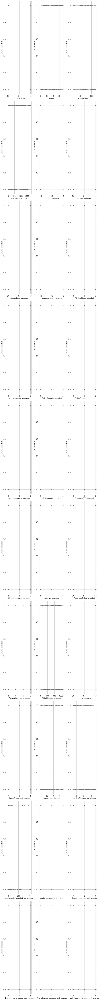

In [30]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.scatterplot(colist[x], y='Churn_encoded', data=final_dataframe)
        plt.tight_layout()
    except ValueError:
        continue

# It can be visualized from above scatter plots against outcome vector that distribution is mostly evenly distributed for most of the columns. For example, 

## Senior Citizen

## Tenure

## Monthly Charges Pct Change

## Customer Id

## Gender Encoded

## Partner Encoded

## Dependent Encoded

## Phone ServiceEncoded

## Multiple Lines Encoded Pct Change

## Online Security Encoded Pct Change

## Online Backup Encoded Pct Change

## Device Protection Encoded

## Tech Support Encoded

## Streaming Tv encoded

## Streaming Movies Encoded

## Contract Encoded

## Paperless Billing Encoded.... Many More....



# Anomalies Detected

### Churn: Yes is encoded as 1 and No is encoded as 0

### Highest Charge is paid by female.

### Customer loyalty is not affected by tech support option chosen by them.

### Phone service is mostly widespread service of al the services.


# Q&A Answered

### What is the range of monthly charges: 0 to 200.

### What is the range of multiple lines encoded: 0 to 2.

### What is the range of online security encoded: 0 to 2.

### What is the range of online backup encoded: 0 to 2.

# Value Count Of employees vulnerable to attrition and not.

In [31]:
data['Churn_encoded'].value_counts()

0.0    5174
1.0    1869
Name: Churn_encoded, dtype: int64

# The above cell displays that the number of people prone to attritition are 1869 against not prone to attrition 5174.

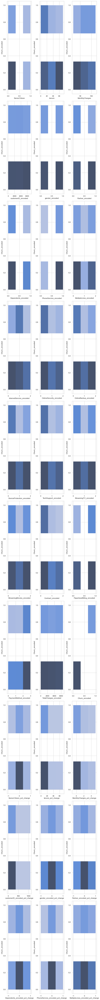

In [32]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
9nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.histplot(x=colist[x], y='Churn_encoded', data=final_dataframe, bins=3)
        plt.tight_layout()
    except ValueError:
        continue

# The above histograms show frequency distribution of features against label. It is divided into 3 bins. Left skewness is observed in ['PhoneService_encoded', 'PaperlessBilling_encoded', 'MonthlyCharges',
#       'PaymentMethod_encoded', 'gender_encoded',
#       'StreamingTV_encoded_pct_change', 'OnlineBackup_encoded_pct_change',
  #     'Contract_encoded_pct_change', 'gender_encoded_pct_change'].
# Right skewness is observed in ['Partner_encoded_pct_change', 'PhoneService_encoded_pct_change',
#       'MultipleLines_encoded_pct_change',
#       'StreamingMovies_encoded_pct_change',
#       'InternetService_encoded_pct_change',
#       'DeviceProtection_encoded_pct_change',
#       'OnlineSecurity_encoded_pct_change', 'StreamingMovies_encoded',
#       'TechSupport_encoded_pct_change', 'TotalCharges_encoded',
#       'StreamingTV_encoded', 'Partner_encoded', 'MultipleLines_encoded',
#       'OnlineBackup_encoded', 'DeviceProtection_encoded',
#       'InternetService_encoded', 'tenure', 'PaymentMethod_encoded_pct_change',
 #      'TechSupport_encoded', 'OnlineSecurity_encoded', 'Contract_encoded',
#       'Dependents_encoded', 'Churn_encoded', 'MonthlyCharges_pct_change',
#       'SeniorCitizen', 'tenure_pct_change', 'customerID_encoded_pct_change',
#       'TotalCharges_encoded_pct_change']

# Many datapoints, ['PaperlessBilling_encoded', 'MonthlyCharges', 'PaymentMethod_encoded',
 #      'gender_encoded', 'StreamingTV_encoded_pct_change',
 #      'OnlineBackup_encoded_pct_change', 'Contract_encoded_pct_change',
 #      'gender_encoded_pct_change', 'Churn_encoded_pct_change',
 #      'customerID_encoded', 'Dependents_encoded_pct_change',
 #      'PaperlessBilling_encoded_pct_change', 'SeniorCitizen_pct_change',
 #      'Partner_encoded_pct_change', 'PhoneService_encoded_pct_change',
  #     'MultipleLines_encoded_pct_change',
 #      'StreamingMovies_encoded_pct_change',
 #      'InternetService_encoded_pct_change',
#       'DeviceProtection_encoded_pct_change',
#       'OnlineSecurity_encoded_pct_change', 'StreamingMovies_encoded',
 #      'TechSupport_encoded_pct_change', 'TotalCharges_encoded',
 #      'StreamingTV_encoded', 'Partner_encoded', 'MultipleLines_encoded',
 #      'OnlineBackup_encoded', 'DeviceProtection_encoded',
 #      'InternetService_encoded', 'tenure', 'PaymentMethod_encoded_pct_change',
 #      'TechSupport_encoded', 'OnlineSecurity_encoded', 'Contract_encoded'] be close to normal with skewness threshold within +/-0.65.
# Of above mentioned columns, 5 columns have 0 skewness (as desired in normal distribution)

# Correlation Analysis

In [33]:
final_dataframe.corr()

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change,Churn_encoded_pct_change
SeniorCitizen,1.000000,0.016567,0.220173,-0.002074,-0.001874,0.016479,-0.211185,0.008576,0.146185,-0.032310,...,-0.031929,-0.040315,-0.117299,0.003810,0.021841,-0.092308,0.110763,-0.016060,-0.004466,0.100231
tenure,0.016567,1.000000,0.247900,0.008035,0.005106,0.379697,0.159712,0.008448,0.343032,-0.030359,...,0.266672,0.265346,0.217212,0.202925,0.205962,0.484248,-0.007621,-0.270571,0.027406,-0.260116
MonthlyCharges,0.220173,0.247900,1.000000,-0.003916,-0.014569,0.096848,-0.113890,0.247398,0.433576,-0.323260,...,-0.005551,0.026239,-0.088441,0.146612,0.153713,-0.041439,0.240155,-0.122307,0.024693,0.121778
customerID_encoded,-0.002074,0.008035,-0.003916,1.000000,0.006288,-0.026729,-0.012823,-0.006483,0.004316,-0.012407,...,0.005751,0.018449,0.001313,0.010646,0.002935,0.020245,-0.003952,-0.012660,0.009280,-0.019918
gender_encoded,-0.001874,0.005106,-0.014569,0.006288,1.000000,-0.001808,0.010517,-0.006488,-0.006739,-0.000863,...,-0.017536,-0.001206,0.005476,-0.001473,-0.001048,0.010991,-0.010106,0.004233,-0.017443,-0.009973
Partner_encoded,0.016479,0.379697,0.096848,-0.026729,-0.001808,1.000000,0.452676,0.017706,0.142410,0.000891,...,0.114330,0.113673,0.097710,0.094890,0.082903,0.213156,-0.016987,-0.117977,0.022557,-0.118379
Dependents_encoded,-0.211185,0.159712,-0.113890,-0.012823,0.010517,0.452676,1.000000,-0.001762,-0.024991,0.044590,...,0.079036,0.058471,0.105077,0.051803,0.029342,0.173767,-0.078976,-0.026416,0.019510,-0.106378
PhoneService_encoded,0.008576,0.008448,0.247398,-0.006483,-0.006488,0.017706,-0.001762,1.000000,-0.020538,0.387436,...,0.043242,0.022814,0.009498,0.056430,0.038258,0.003246,0.020502,-0.006630,0.005170,0.001533
MultipleLines_encoded,0.146185,0.343032,0.433576,0.004316,-0.006739,0.142410,-0.024991,-0.020538,1.000000,-0.109216,...,0.054935,0.052401,-0.027469,0.088208,0.085583,0.065729,0.101854,-0.122348,0.019634,0.029153
InternetService_encoded,-0.032310,-0.030359,-0.323260,-0.012407,-0.000863,0.000891,0.044590,0.387436,-0.109216,1.000000,...,0.128980,0.117699,0.072228,0.165488,0.143350,0.053190,-0.089583,0.058848,0.003604,-0.026728


# The above table represents correlation among dataset. There seems some multicollinearity due to presence of contract encoded and tenure; that show strong correlation between each other. Other  than these columns, original columns and percentage transformation columns show multicoliinearity between each. Thde best way to find better version of the two to predict chance of churn is ANOVA Test and correlation with label. There seems modest collinearity among all other features. We will do further eda before arriving at a conclusion to delete these columns.

# Graphical Representation Of Correlation Of Features With Label

In [34]:
import cufflinks as cf
cf.set_config_file(offline=True)
pd.DataFrame((final_dataframe.corr()['Churn_encoded'])).iplot(title='Correlation Of Variables With Label')

# The above iplot represents correlation of features with label. Correlation of features with labe is of high relevance. The stronger the relationship of label with axis, the more accurate the prediction. In the above line graph:

## 1. Ignoring churn encoded and churn encoded pct change, highest correlation with label is observed to be 19.34%, that is shared with Monthly Charges. Minimum correlation is -0.21%, shared with Phone service encoded pct change.

## 2. Weak Positive Relationship Is Found With Following Features:

    PhoneService_encoded_pct_change        0.002102

    customerID_encoded_pct_change          0.010336
    
    PhoneService_encoded                   0.011942
    
    TotalCharges_encoded                   0.014479
    
    MultipleLines_encoded_pct_change       0.034089
    
    MultipleLines_encoded                  0.038037
    
    PaymentMethod_encoded_pct_change       0.083529
    
    PaymentMethod_encoded                  0.107062
    
    MonthlyCharges_pct_change              0.108711
    
    SeniorCitizen_pct_change               0.117390
    
    PaperlessBilling_encoded_pct_change    0.140069
    
    SeniorCitizen                          0.150889
    
    PaperlessBilling_encoded               0.191825
    
    MonthlyCharges                         0.193356


## 3. Weak Negative Relationship Is Found With Following Features:

    Contract_encoded                      -0.396713

    tenure                                -0.352229
    
    OnlineSecurity_encoded                -0.289309
    
    Contract_encoded_pct_change           -0.284683
    
    TechSupport_encoded                   -0.282492
    
    OnlineSecurity_encoded_pct_change     -0.234502
    
    TechSupport_encoded_pct_change        -0.229517
    
    OnlineBackup_encoded                  -0.195525
    
    DeviceProtection_encoded              -0.178134
    
    Dependents_encoded                    -0.164221
    
    OnlineBackup_encoded_pct_change       -0.163660
    
    DeviceProtection_encoded_pct_change   -0.152398
    
    Partner_encoded                       -0.150448
    
    Dependents_encoded_pct_change         -0.114801
    
    tenure_pct_change                     -0.112268
    
    Partner_encoded_pct_change            -0.111593
    
    StreamingTV_encoded_pct_change        -0.050802
    
    InternetService_encoded               -0.047291
    
    StreamingMovies_encoded_pct_change    -0.040728
    
    StreamingMovies_encoded               -0.038492
    
    StreamingTV_encoded                   -0.036581
    
    customerID_encoded                    -0.017447
    
    TotalCharges_encoded_pct_change       -0.009617
    
    gender_encoded                        -0.008612
    
    InternetService_encoded_pct_change    -0.004209
    
    gender_encoded_pct_change             -0.002847


## 4. Correlation Of Label with itself is of no relevance

# Mathematical Notation:
Correlation (X, Y) = (Covariance Of X and Covariance Of Y)/(Std Of X and Std Of Y)

# Correlation Heatmaps Of Entire Dataset

<AxesSubplot:>

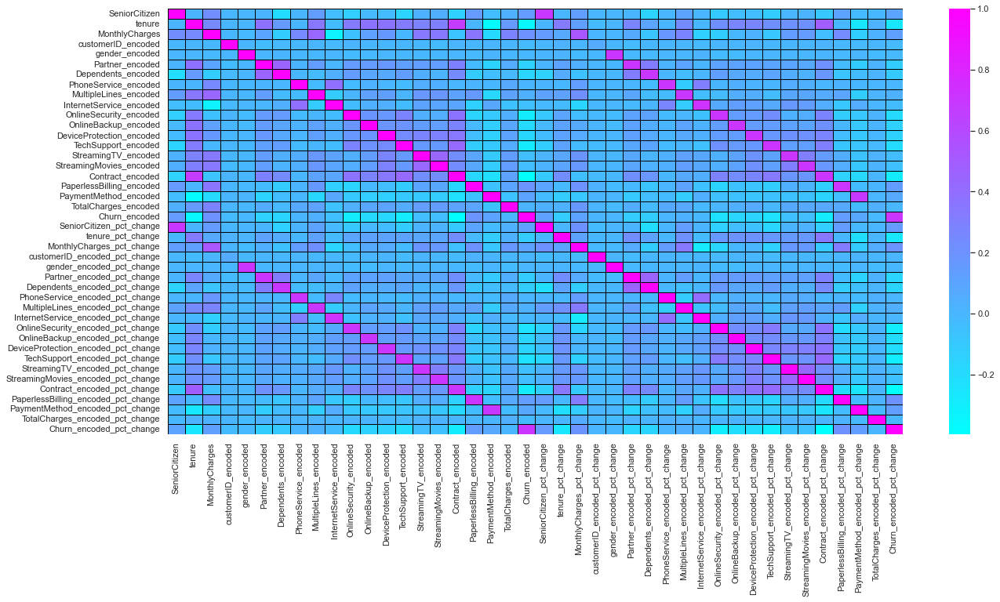

In [35]:
plt.figure(figsize=(21,10))
sns.heatmap(final_dataframe.corr(), annot=False, linewidths=0.5, linecolor='black', fmt='.2f', cmap='cool')

In [55]:
final_dataframe.corr()['Churn_encoded'][final_dataframe.corr()['Churn_encoded']>0].index

Index(['SeniorCitizen', 'MonthlyCharges', 'PhoneService_encoded',
       'MultipleLines_encoded', 'PaperlessBilling_encoded',
       'PaymentMethod_encoded', 'TotalCharges_encoded', 'Churn_encoded',
       'SeniorCitizen_pct_change', 'MonthlyCharges_pct_change',
       'customerID_encoded_pct_change', 'PhoneService_encoded_pct_change',
       'MultipleLines_encoded_pct_change',
       'PaperlessBilling_encoded_pct_change',
       'PaymentMethod_encoded_pct_change', 'Churn_encoded_pct_change'],
      dtype='object')

# Verbal Translation Of Above Graph:
## 1. Label has weak negative relationship with these features:

# ['tenure', 'customerID_encoded', 'gender_encoded', 'Partner_encoded',
#       'Dependents_encoded', 'InternetService_encoded',
#       'OnlineSecurity_encoded', 'OnlineBackup_encoded',
 #      'DeviceProtection_encoded', 'TechSupport_encoded',
 #      'StreamingTV_encoded', 'StreamingMovies_encoded', 'Contract_encoded',
#       'tenure_pct_change', 'gender_encoded_pct_change',
#       'Partner_encoded_pct_change', 'Dependents_encoded_pct_change',
#       'InternetService_encoded_pct_change',
#       'OnlineSecurity_encoded_pct_change', 'OnlineBackup_encoded_pct_change',
#       'DeviceProtection_encoded_pct_change', 'TechSupport_encoded_pct_change',
#       'StreamingTV_encoded_pct_change', 'StreamingMovies_encoded_pct_change',
#       'Contract_encoded_pct_change', 'TotalCharges_encoded_pct_change']


## 2. Label has weak positive to strong positive relationship with these features in this heatmap:

# ['SeniorCitizen', 'MonthlyCharges', 'PhoneService_encoded',
#       'MultipleLines_encoded', 'PaperlessBilling_encoded',
#       'PaymentMethod_encoded', 'TotalCharges_encoded', 'Churn_encoded',
#       'SeniorCitizen_pct_change', 'MonthlyCharges_pct_change',
#       'customerID_encoded_pct_change', 'PhoneService_encoded_pct_change',
#       'MultipleLines_encoded_pct_change',
#       'PaperlessBilling_encoded_pct_change',
#       'PaymentMethod_encoded_pct_change', 'Churn_encoded_pct_change']


## 3. Strong Multicollinearity is detected among 2 features:

    contract encoded
    
    tenure

## 4. Multicollinearity seems to be moderate among all other data points.

## Q&A Answered

        1. Most useful feature is: Monthly Charges.

        2. Features that can cause bias are: Contract Encoded And Tenure.

        3. Explanatory Power of all variable: Weak (due to weak correlation with label).

# Data Handling Conclusion Of Correlation

# Overall correlation among dataset. There seems some multicollinearity due to presence of Contract Encoded and Tenure; that show strong correlation between each other. Other than these columns there seems correlation. We will do further eda before arriving at a conclusion to delete these columns.

## The most useful feature is Monthly Charges, apart from this, there seems modest correlation of features with label.

## As a conclusion, we will do further cause and effect analysis based on skewness and distribution plots to conclude if we want to remove multicollinarity pairs:

    i. Contract Encoded and Tenure
    ii. Original column and its percentage change

# Dataset Information Table

In [36]:
final_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 42 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   SeniorCitizen                        7043 non-null   int64  
 1   tenure                               7043 non-null   int64  
 2   MonthlyCharges                       7043 non-null   float64
 3   customerID_encoded                   7043 non-null   float64
 4   gender_encoded                       7043 non-null   float64
 5   Partner_encoded                      7043 non-null   float64
 6   Dependents_encoded                   7043 non-null   float64
 7   PhoneService_encoded                 7043 non-null   float64
 8   MultipleLines_encoded                7043 non-null   float64
 9   InternetService_encoded              7043 non-null   float64
 10  OnlineSecurity_encoded               7043 non-null   float64
 11  OnlineBackup_encoded          

# The above table reprents information dataset:
    
i. Columns

ii. Count Of Non Null Data Points

iii. Values data type for each columns

iv. Count of data types in iii.

v. Memory Usage

It can be deduced that the dataset has 7043 rows and each column has no missing value. The datatypes used are float64 and int64. There 40 float64 columns, 2 int64 columns. Memory usage is 2.3 MB.

# Names of all the columns

In [37]:
data.select_dtypes(include = [np.number]).columns

Index(['SeniorCitizen', 'tenure', 'MonthlyCharges', 'customerID_encoded',
       'gender_encoded', 'Partner_encoded', 'Dependents_encoded',
       'PhoneService_encoded', 'MultipleLines_encoded',
       'InternetService_encoded', 'OnlineSecurity_encoded',
       'OnlineBackup_encoded', 'DeviceProtection_encoded',
       'TechSupport_encoded', 'StreamingTV_encoded', 'StreamingMovies_encoded',
       'Contract_encoded', 'PaperlessBilling_encoded', 'PaymentMethod_encoded',
       'TotalCharges_encoded', 'Churn_encoded', 'SeniorCitizen_pct_change',
       'tenure_pct_change', 'MonthlyCharges_pct_change',
       'customerID_encoded_pct_change', 'gender_encoded_pct_change',
       'Partner_encoded_pct_change', 'Dependents_encoded_pct_change',
       'PhoneService_encoded_pct_change', 'MultipleLines_encoded_pct_change',
       'InternetService_encoded_pct_change',
       'OnlineSecurity_encoded_pct_change', 'OnlineBackup_encoded_pct_change',
       'DeviceProtection_encoded_pct_change', 'Tech

# The above code cell highlights all numeric columns, that will be used to derive following graphs.

# Box Plot To Detect Outliers

In [38]:
import plotly.express as px
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
for x in colist:
    try:
        fig = px.box(final_dataframe, x = x, y='Churn_encoded')
        fig.show()
    except ValueError:
        print('{0} vales out of range, try skewness function to detect outliers'.format(x))
        continue

# Verbal Translation Of Above Graph
# 1. The data has many outliers.
# 2.  The columns free of outliers are:
        Total Charges Encoded
        
        Monthly Charges Pct Change
        
        Customer Id Encoded Pct Change
        
        Gender Encoded Pct Change
 
        Total Charges Encoded Pct Change
        
        Gender Encoded
        
        Customer Id Encoded



# Multicollinearity Test Among Selected Features

In [62]:
final_dataframe[['TotalCharges_encoded', 'TotalCharges_encoded_pct_change', 'MonthlyCharges_pct_change', 'customerID_encoded_pct_change', 'gender_encoded', 'customerID_encoded']].corr()

,TotalCharges_encoded,TotalCharges_encoded_pct_change,MonthlyCharges_pct_change,customerID_encoded_pct_change,gender_encoded,customerID_encoded
TotalCharges_encoded,1.000000,0.041667,0.169854,0.007095,-0.005291,0.003027
TotalCharges_encoded_pct_change,0.041667,1.000000,0.059344,-0.002869,-0.017443,0.009280
MonthlyCharges_pct_change,0.169854,0.059344,1.000000,-0.010973,-0.016351,0.011461
customerID_encoded_pct_change,0.007095,-0.002869,-0.010973,1.000000,-0.004451,0.065840
gender_encoded,-0.005291,-0.017443,-0.016351,-0.004451,1.000000,0.006288
customerID_encoded,0.003027,0.009280,0.011461,0.065840,0.006288,1.000000


# Data Handling Conclusion For Outliers

# By studying box plots and correlation analysis, we have arrived at 7 best features. We will do further eda with vif, dist plots and descriptive statistics to finally select a set of features.

# Descriptive Statistics

In [39]:
description=final_dataframe.describe()
description

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change,Churn_encoded_pct_change
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,...,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.0000
mean,0.162147,32.371149,64.761692,3521.000000,0.504756,0.483033,0.299588,0.903166,0.940508,0.872923,...,0.038052,0.029888,0.024989,0.043731,0.038904,0.027971,0.000000,0.113044,3.563420,0.0000
std,0.368612,24.559481,30.090047,2033.283305,0.500013,0.499748,0.458110,0.295752,0.948554,0.737796,...,0.765617,0.765724,0.760434,0.764292,0.759709,0.750981,0.702574,0.813871,71.466936,0.6265
min,0.000000,0.000000,18.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.0000
25%,0.000000,9.000000,35.500000,1760.500000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,-0.500000,-1.000000,-1.000000,-0.500000,-0.500000,-0.500000,0.000000,-0.500000,-0.498749,0.0000
50%,0.000000,29.000000,70.350000,3521.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000604,0.0000
75%,0.000000,55.000000,89.850000,5281.500000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.0000
max,1.000000,72.000000,118.750000,7042.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,5671.000000,1.0000


In [40]:
lst=description.columns.to_list()
print(lst)

['SeniorCitizen', 'tenure', 'MonthlyCharges', 'customerID_encoded', 'gender_encoded', 'Partner_encoded', 'Dependents_encoded', 'PhoneService_encoded', 'MultipleLines_encoded', 'InternetService_encoded', 'OnlineSecurity_encoded', 'OnlineBackup_encoded', 'DeviceProtection_encoded', 'TechSupport_encoded', 'StreamingTV_encoded', 'StreamingMovies_encoded', 'Contract_encoded', 'PaperlessBilling_encoded', 'PaymentMethod_encoded', 'TotalCharges_encoded', 'Churn_encoded', 'SeniorCitizen_pct_change', 'tenure_pct_change', 'MonthlyCharges_pct_change', 'customerID_encoded_pct_change', 'gender_encoded_pct_change', 'Partner_encoded_pct_change', 'Dependents_encoded_pct_change', 'PhoneService_encoded_pct_change', 'MultipleLines_encoded_pct_change', 'InternetService_encoded_pct_change', 'OnlineSecurity_encoded_pct_change', 'OnlineBackup_encoded_pct_change', 'DeviceProtection_encoded_pct_change', 'TechSupport_encoded_pct_change', 'StreamingTV_encoded_pct_change', 'StreamingMovies_encoded_pct_change', 'Co

In [41]:
lst1=[]
for x in range(len(lst)):
    lst1.append([description.iloc[6,x]-description.iloc[5,x]])
len(lst1), print(lst1)

[[0.0], [26.0], [19.5], [1760.5], [0.0], [1.0], [1.0], [0.0], [1.0], [0.0], [1.0], [1.0], [1.0], [1.0], [1.0], [1.0], [1.0], [0.0], [0.0], [1652.5], [1.0], [0.0], [2.1052631578947367], [0.6126233246304866], [1.0046919124928952], [1.0], [0.0], [0.0], [0.0], [1.0], [1.0], [1.0], [1.0], [1.0], [1.0], [1.0], [1.0], [1.0], [0.0], [1.0], [1.0006038647342996], [0.0]]


(42, None)

In [42]:
lst1_frame=pd.DataFrame(data=lst1, index=lst, columns=['IQR'])
lst1_frame=lst1_frame.T
lst1_frame

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change,Churn_encoded_pct_change
IQR,0.0,26.0,19.5,1760.5,0.0,1.0,1.0,0.0,1.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.000604,0.0


In [43]:
lst3=[]
for x in range(len(lst)):
    lst3.append([description.iloc[7,x]-description.iloc[3,x]])
len(lst3), print(lst3)

[[1.0], [72.0], [100.5], [7042.0], [1.0], [1.0], [1.0], [1.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [1.0], [3.0], [6530.0], [1.0], [2.0], [72.0], [5.959784376764706], [1093.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [2.0], [3.0], [5672.0], [2.0]]


(42, None)

In [44]:
lst3_frame=pd.DataFrame(data=lst3, index=lst, columns=['Range'])
lst3_frame=lst3_frame.T
lst3_frame

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change,Churn_encoded_pct_change
Range,1.0,72.0,100.5,7042.0,1.0,1.0,1.0,1.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,5672.0,2.0


In [45]:
lst5=pd.DataFrame(data=final_dataframe.skew().to_list(), index=lst, columns=['Skewness'])
lst5=lst5.T
lst6=pd.DataFrame(data=final_dataframe.kurtosis().to_list(), index=lst, columns=['Kurtosis'])
lst6=lst6.T
lst5, lst6

(          SeniorCitizen   tenure  MonthlyCharges  customerID_encoded  \
 Skewness       1.833633  0.23954       -0.220524                 0.0   
 
           gender_encoded  Partner_encoded  Dependents_encoded  \
 Skewness       -0.019031         0.067922            0.875199   
 
           PhoneService_encoded  MultipleLines_encoded  \
 Skewness             -2.727153               0.118719   
 
           InternetService_encoded  ...  OnlineBackup_encoded_pct_change  \
 Skewness                 0.205423  ...                        -0.004621   
 
           DeviceProtection_encoded_pct_change  TechSupport_encoded_pct_change  \
 Skewness                             0.012171                        0.015138   
 
           StreamingTV_encoded_pct_change  StreamingMovies_encoded_pct_change  \
 Skewness                       -0.006605                            0.007363   
 
           Contract_encoded_pct_change  PaperlessBilling_encoded_pct_change  \
 Skewness                     -0.0014

# Outcome Table Of Descriptive Statistics

In [46]:
description1=pd.concat([description, lst1_frame, lst3_frame, lst5, lst6])
description1

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change,Churn_encoded_pct_change
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,...,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.00000
mean,0.162147,32.371149,64.761692,3521.000000,0.504756,0.483033,0.299588,0.903166,0.940508,0.872923,...,0.038052,0.029888,0.024989,0.043731,0.038904,0.027971,0.000000,0.113044,3.563420,0.00000
std,0.368612,24.559481,30.090047,2033.283305,0.500013,0.499748,0.458110,0.295752,0.948554,0.737796,...,0.765617,0.765724,0.760434,0.764292,0.759709,0.750981,0.702574,0.813871,71.466936,0.62650
min,0.000000,0.000000,18.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.00000
25%,0.000000,9.000000,35.500000,1760.500000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,-0.500000,-1.000000,-1.000000,-0.500000,-0.500000,-0.500000,0.000000,-0.500000,-0.498749,0.00000
50%,0.000000,29.000000,70.350000,3521.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000604,0.00000
75%,0.000000,55.000000,89.850000,5281.500000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.00000
max,1.000000,72.000000,118.750000,7042.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,5671.000000,1.00000
IQR,0.000000,26.000000,19.500000,1760.500000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000604,0.00000
Range,1.000000,72.000000,100.500000,7042.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,5672.000000,2.00000


# Graphical Representation Of Above Table

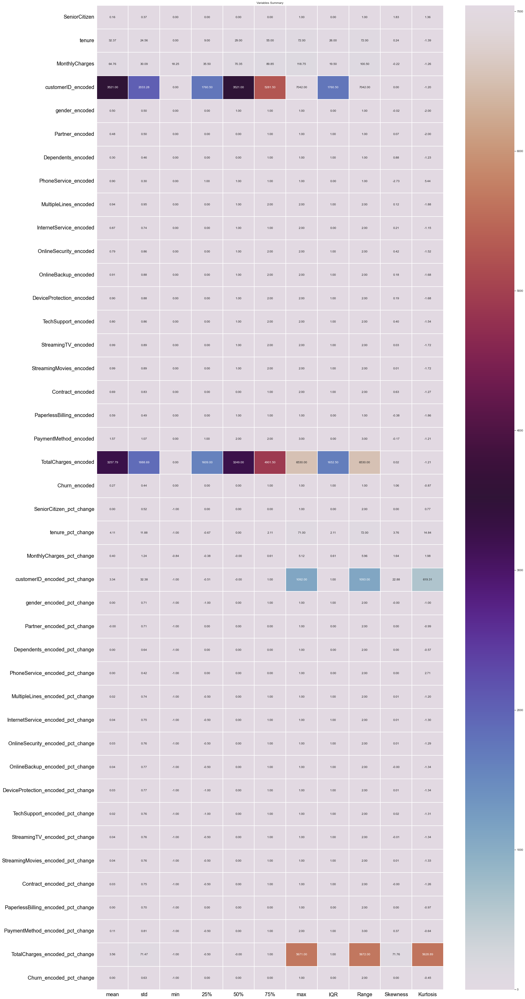

In [47]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize=(30,70))
sns.heatmap(round(description1[1:].transpose(),2), linewidth=2, annot=True, fmt='.2f', square=False, color='Black', cmap='twilight')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=20, color='black')
plt.title('Variables Summary')
plt.show()

# Mathematical Notation:
1. Mean = sum of values/count of values                                                                                     
2. std = sqrt(((value - mean of distribution)**2 / number of values ))                                                                                        
3. 3 quartile are measures of variance, calculated to spot the placeholder value, it returns index of the produced value.
Step 1: sort the dataset                                                                                                   
Step2:                                                                                                                     
i) Lower Quartile (Q1: 25% distribution) = ((number of values+1)/4)th Term                                                 
ii) Middle Quartile (Q2: 50% distribution) = ((number of values +1)/2)th Term                                               
Also, know as median (central value).                                                                                       
iii) Upper Quartile (Q3: 75% distribution) = ¾(number of values + 1)th Term                                                 
iv) IQR = Upper Quartile - Lowe Quartile                                                                                   
4. Range = Maximum Value - Minimum Value                                                                                   
5. Skewness = (sumation(value - mean of distribution)**3)/((number of values - 1) * std**3)                                 
6. Kurtosis = number of values * ((sumation(value - mean of distribution)**4) / std**4)

# Verbal Translation Of Descriptive Table And Graphic
## 1. For values that are scaled upto 1, mean is mostly around 0 and standard deviation is comparatively low. Hence, making the data much more acceptable by algorithms to process it more accurately.

## 2. The entire dataset ranges from -1 till 7042.0.

## 3. IQR, Range and Skewness and kurtosis are much more condensed in data that is scaled upto 1.

## 4. Skewness is 0 and within +/- 0.65 for:
    ['tenure', 'MonthlyCharges', 'customerID_encoded', 'gender_encoded',
           'Partner_encoded', 'MultipleLines_encoded', 'InternetService_encoded',
           'OnlineSecurity_encoded', 'OnlineBackup_encoded',
           'DeviceProtection_encoded', 'TechSupport_encoded',
           'StreamingTV_encoded', 'StreamingMovies_encoded', 'Contract_encoded',
           'PaperlessBilling_encoded', 'PaymentMethod_encoded',
           'TotalCharges_encoded', 'SeniorCitizen_pct_change',
           'gender_encoded_pct_change', 'Partner_encoded_pct_change',
           'Dependents_encoded_pct_change', 'PhoneService_encoded_pct_change',
           'MultipleLines_encoded_pct_change',
           'InternetService_encoded_pct_change',
           'OnlineSecurity_encoded_pct_change', 'OnlineBackup_encoded_pct_change',
           'DeviceProtection_encoded_pct_change', 'TechSupport_encoded_pct_change',
           'StreamingTV_encoded_pct_change', 'StreamingMovies_encoded_pct_change',
           'Contract_encoded_pct_change', 'PaperlessBilling_encoded_pct_change',
           'PaymentMethod_encoded_pct_change', 'Churn_encoded_pct_change']

## 5. Acceptable skewness is +/- 0.65 and skewness for bell shaped curve should be 0.

## 6. Kutosis is upto 3 for most dataset, indicating platykurtic curves:

    ['SeniorCitizen', 'tenure', 'MonthlyCharges', 'customerID_encoded',
           'gender_encoded', 'Partner_encoded', 'Dependents_encoded',
           'MultipleLines_encoded', 'InternetService_encoded',
           'OnlineSecurity_encoded', 'OnlineBackup_encoded',
           'DeviceProtection_encoded', 'TechSupport_encoded',
           'StreamingTV_encoded', 'StreamingMovies_encoded', 'Contract_encoded',
           'PaperlessBilling_encoded', 'PaymentMethod_encoded',
           'TotalCharges_encoded', 'Churn_encoded', 'SeniorCitizen_pct_change',
           'MonthlyCharges_pct_change', 'gender_encoded_pct_change',
           'Partner_encoded_pct_change', 'Dependents_encoded_pct_change',
           'PhoneService_encoded_pct_change', 'MultipleLines_encoded_pct_change',
           'InternetService_encoded_pct_change',
           'OnlineSecurity_encoded_pct_change', 'OnlineBackup_encoded_pct_change',
           'DeviceProtection_encoded_pct_change', 'TechSupport_encoded_pct_change',
           'StreamingTV_encoded_pct_change', 'StreamingMovies_encoded_pct_change',
           'Contract_encoded_pct_change', 'PaperlessBilling_encoded_pct_change',
           'PaymentMethod_encoded_pct_change', 'Churn_encoded_pct_change']
           

## 7. Kurtosis is greater than 3, indicating, leptokurtic curve:

    ['PhoneService_encoded', 'tenure_pct_change',
           'customerID_encoded_pct_change', 'TotalCharges_encoded_pct_change']
       

## 8. Kurtosis for bell shaped curve should be 3.

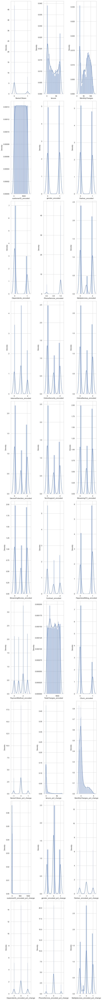

In [48]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.distplot(final_dataframe[colist[x]])
        plt.tight_layout()
    except ValueError:
        continue

# Observations
## 1. Acceptable skewness is +/-0.65 and Right skewness for bell shaped curve is 0

## 2. Acceptable and Outliers Prone Left skewness is observed in:

        PhoneService_encoded              -2.727153

        PaperlessBilling_encoded          -0.375396

        MonthlyCharges                    -0.220524

        PaymentMethod_encoded             -0.170129

        gender_encoded                    -0.019031

        StreamingTV_encoded_pct_change    -0.006605

        OnlineBackup_encoded_pct_change   -0.004621

        Contract_encoded_pct_change       -0.001480

        gender_encoded_pct_change         -0.000201


## 3. Acceptable And Outliers Prone Right Skewness is observed in:

        Partner_encoded_pct_change              0.000199

        PhoneService_encoded_pct_change         0.000921
        
        MultipleLines_encoded_pct_change        0.006366
        
        StreamingMovies_encoded_pct_change      0.007363
        
        InternetService_encoded_pct_change      0.011816
        
        DeviceProtection_encoded_pct_change     0.012171
        
        OnlineSecurity_encoded_pct_change       0.012453
        
        StreamingMovies_encoded                 0.014657
        
        TechSupport_encoded_pct_change          0.015138
        
        TotalCharges_encoded                    0.015857
        
        StreamingTV_encoded                     0.028486
        
        Partner_encoded                         0.067922
        
        MultipleLines_encoded                   0.118719
        
        OnlineBackup_encoded                    0.182930
        
        DeviceProtection_encoded                0.186847
        
        InternetService_encoded                 0.205423
        
        tenure                                  0.239540
        
        PaymentMethod_encoded_pct_change        0.374943
        
        TechSupport_encoded                     0.402365
        
        OnlineSecurity_encoded                  0.416985
        
        Contract_encoded                        0.630959
        
        Dependents_encoded                      0.875199
        
        Churn_encoded                           1.063031
        
        MonthlyCharges_pct_change               1.637803
        
        SeniorCitizen                           1.833633
        
        tenure_pct_change                       3.756901
        
        customerID_encoded_pct_change          22.880781
        
        TotalCharges_encoded_pct_change        71.764349

## 4. Bell Shaped Curve (O skewness) is observed in:

        customerID_encoded                     0.0
        
        SeniorCitizen_pct_change               0.0
        
        Dependents_encoded_pct_change          0.0
        
        PaperlessBilling_encoded_pct_change    0.0
        
        Churn_encoded_pct_change               0.0

# Verifying Findings Of Multicollinearity: Multicoliinearity Pairs

In [49]:
correlation=final_dataframe.corr()
correlation[correlation>0.5]

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change,Churn_encoded_pct_change
SeniorCitizen,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tenure,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthlyCharges,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
customerID_encoded,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender_encoded,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Partner_encoded,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependents_encoded,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PhoneService_encoded,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MultipleLines_encoded,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
InternetService_encoded,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# The above table highlights all the multicollinearity (biased) pairs

# Conclusion:
## Based On EDA done above in two parts, I will do ftest and pvalue test on these seemingly weak indicators based primarily on skewness, kurtosis and multicollinearity:

    i) customerID_encoded_pct_change

    ii) TotalCharges_encoded_pct_change

    iii) tenure_pct_change

    iv) contract_encoded



# ANOVA Test On Selected Features
## Ftest score should be greater than 1 and p value should be less than 0.05, to determine to keep these features for further analysis

# Feature 1: Customer ID Percentage Change

In [50]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['customerID_encoded_pct_change'], final_dataframe['Churn_encoded'])
f,p

(63.640454002092866, 1.6078676325418e-15)

# Feature 2: Total Charges Encoded Percentage Change

In [51]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['TotalCharges_encoded_pct_change'], final_dataframe['Churn_encoded'])
f,p

(14.99841026944687, 0.00010808826977885861)

# Feature 3: Tenure Percentage Change

In [52]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['tenure_pct_change'], final_dataframe['Churn_encoded'])
f,p

(738.2495349063241, 1.6971106521898449e-158)

# Feature 4: Contract Encoded

In [53]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['Contract_encoded'], final_dataframe['Churn_encoded'])
f,p

(1429.8658951769567, 4.1986883391347155e-298)

# Error Removal And Data Handling

## Based on above analysis:
## 1. There are no outliers in the data.
## 2. Strong multicolliearity features are important for prediction because there f test and p value are acceptable. This means that the amount of multicollineaity is insignificant and removing the feature will not impact the model much.

# 3. Extereme leptokurtic and right skewed features are also relatively significant based on f test and p test.

# Hence, as a solution, feature scaling will do a better job in explaining the dependent variable than removing whole columns.

# The above table represents final dataframe that will go through machine learning  techniques of outliers treatment

# Z Score: Outliers Treatment

In [81]:
import numpy as np
from scipy.stats import stats
from sklearn.preprocessing import StandardScaler
final_dataframe[np.isinf(final_dataframe)] = 0
scaled = StandardScaler()
final_dataframe=final_dataframe.fillna(method='ffill')
scaled.fit(final_dataframe)
scaled_data = scaled.transform(final_dataframe)
score=np.abs(stats.zscore(scaled_data))
score.shape

(7043, 42)

In [82]:
#threshold=(-3,3)
threshold=3
print(np.where(score>3))

(array([   0,    3,    7, ..., 7029, 7036, 7040], dtype=int64), array([7, 7, 7, ..., 7, 7, 7], dtype=int64))


# The above cell displays outlier values.

In [83]:
len(np.where(score>3)[0])

1082

# The above cell shows number of outliers.

In [84]:
data_new=final_dataframe[(score<3).all(axis=1)]
data_new

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change,Churn_encoded_pct_change
1,0,34,56.95,3962.0,1.0,0.0,0.0,1.0,0.0,0.0,...,-1.0,1.0,0.0,0.0,0.0,1.0,-1.0,0.500000,-0.414770,0.0
2,0,2,53.85,2564.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,-1.0,0.0,0.0,0.0,-1.0,1.0,0.000000,-0.892906,1.0
4,0,2,70.70,6511.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,-1.0,-1.0,0.0,0.0,-1.0,1.0,1.000000,-0.339286,1.0
5,0,8,99.65,6551.0,0.0,0.0,0.0,1.0,2.0,1.0,...,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.000000,5.598919,0.0
6,0,22,89.10,1002.0,1.0,0.0,1.0,1.0,2.0,1.0,...,1.0,-1.0,0.0,0.0,-1.0,0.0,0.0,-0.500000,-0.746068,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7037,0,72,21.15,1758.0,0.0,0.0,0.0,1.0,0.0,2.0,...,-0.5,-0.5,-0.5,-0.5,-0.5,1.0,1.0,-1.000000,-0.865877,0.0
7038,0,24,84.80,4853.0,1.0,1.0,1.0,1.0,2.0,0.0,...,-1.0,1.0,1.0,1.0,1.0,-0.5,0.0,1.000000,1.074026,0.0
7039,0,72,103.20,1525.0,0.0,1.0,1.0,1.0,2.0,1.0,...,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,-0.666667,2.567940,0.0
7041,1,4,74.40,5934.0,1.0,1.0,0.0,1.0,2.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.500000,-0.111556,1.0


# The above table shows the final dataframe after removing outliers, 1082 rows are removed and resultant dimension is 6005 rows * 42 columns

# IQR Method Of Outliers Removal

# Since, most the rows are removed by z method, hence, I will try IQR Method of outliers removal and power transformation method of outliers transformation.

In [85]:
Q1= final_dataframe[final_dataframe.columns].quantile(0.25)
Q3 = final_dataframe[final_dataframe.columns].quantile(0.75)
IQR = Q3 - Q1
upper_limit = Q3 + 1.5 * IQR
lower_limit = Q1 - 1.5 * IQR

# The above code calculates IQR as discussed in descriptive statistics section of eda. It Upper Limit and Lower Limit of distribution curve.

In [86]:
final_dataframe[(final_dataframe[final_dataframe.columns] < lower_limit) | (final_dataframe[final_dataframe.columns] > upper_limit)] # outliers

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change,Churn_encoded_pct_change
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN,7.917197,-1.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7039,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7040,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7041,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


# The above table displays, outliers detected by IQR Method, it displays all values beyond upper and lower limit and places NaN on all the values that are significant and within upper and lower limits.

In [87]:
new_df = final_dataframe[(final_dataframe[final_dataframe.columns] > lower_limit) & (final_dataframe[final_dataframe.columns] < upper_limit)]

In [88]:
new_df=new_df.fillna(method='bfill')
new_df

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change,Churn_encoded_pct_change
0,NaN,1,29.85,5375.0,0.0,1.0,0.0,NaN,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.000000,0.000000,NaN
1,NaN,34,56.95,3962.0,1.0,0.0,0.0,NaN,0.0,0.0,...,-1.0,1.0,0.0,0.0,0.0,1.0,NaN,0.500000,-0.414770,NaN
2,NaN,2,53.85,2564.0,1.0,0.0,0.0,NaN,0.0,0.0,...,1.0,-1.0,0.0,0.0,0.0,-1.0,NaN,0.000000,-0.892906,NaN
3,NaN,45,42.30,5535.0,1.0,0.0,0.0,NaN,1.0,0.0,...,-1.0,1.0,1.0,0.0,0.0,1.0,NaN,-1.000000,-0.339286,NaN
4,NaN,2,70.70,6511.0,0.0,0.0,0.0,NaN,0.0,1.0,...,0.0,-1.0,-1.0,0.0,0.0,-1.0,NaN,1.000000,-0.339286,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,NaN,24,84.80,4853.0,1.0,1.0,1.0,NaN,2.0,0.0,...,-1.0,1.0,1.0,1.0,1.0,-0.5,NaN,1.000000,1.074026,NaN
7039,NaN,72,103.20,1525.0,0.0,1.0,1.0,NaN,2.0,1.0,...,1.0,0.0,-1.0,0.0,0.0,0.0,NaN,-0.666667,2.567940,NaN
7040,NaN,11,29.60,3367.0,0.0,1.0,1.0,NaN,1.0,0.0,...,-1.0,-1.0,0.0,-1.0,-1.0,-1.0,NaN,1.000000,-0.474552,NaN
7041,NaN,4,74.40,5934.0,1.0,1.0,0.0,NaN,2.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.500000,-0.111556,NaN


# The above table displays the final dataframe after IQR  treatment, since this method restores most the rows. It signifies that outliers are not very much spread and can be treated with power transform method after removing significant outliers rows.

# I prefer Z Score+ Power Transform in this case because IQR has a lot of missing values and improper data, whole columns that have significant f value and p value are missing. Hence, I prefer to remove some data points from these columns using z score and then transform the entire dataset to make it free of outliers and retain features explanatory power.

# Vectorization

# I have divided the datset into X and Y vectors by removing label and its transformation from features vector.

Label vector is Churn Encoded.

In [89]:
final_dataframe=data_new.copy()
x=final_dataframe.drop(['Churn_encoded', 'Churn_encoded_pct_change'], axis=1)
y=final_dataframe['Churn_encoded']
x.sample()

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineSecurity_encoded_pct_change,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change
4899,0,4,84.05,1074.0,0.0,0.0,1.0,1.0,2.0,1.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,-1.0,-0.396112


# The above table displays a sample of features vector.

In [90]:
y.sample()

2926    0.0
Name: Churn_encoded, dtype: float64

# The above series displays a sample of label series.

# Outliers Transformation With Power Transform

In [91]:
from sklearn.preprocessing import power_transform
x_array=power_transform(x, method='yeo-johnson')
x_frame=pd.DataFrame(x_array, columns=x.columns)
x_frame

,SeniorCitizen,tenure,MonthlyCharges,customerID_encoded,gender_encoded,Partner_encoded,Dependents_encoded,PhoneService_encoded,MultipleLines_encoded,InternetService_encoded,...,OnlineSecurity_encoded_pct_change,OnlineBackup_encoded_pct_change,DeviceProtection_encoded_pct_change,TechSupport_encoded_pct_change,StreamingTV_encoded_pct_change,StreamingMovies_encoded_pct_change,Contract_encoded_pct_change,PaperlessBilling_encoded_pct_change,PaymentMethod_encoded_pct_change,TotalCharges_encoded_pct_change
0,-0.440000,0.362218,-0.335538,0.315052,0.990883,-0.954251,-0.647782,0.0,-0.905980,-1.388865,...,1.301473,-1.369904,1.294626,0.005192,-0.019517,0.002922,1.324494,-1.420542,0.530568,-0.574941
1,-0.440000,-1.472277,-0.438138,-0.344575,0.990883,-0.954251,-0.647782,0.0,-0.905980,-1.388865,...,-0.008371,1.282564,-1.358713,0.005192,-0.019517,0.002922,-1.355263,1.430557,-0.064821,-1.614550
2,-0.440000,-1.472277,0.126208,1.357823,-1.009201,-0.954251,-0.647782,0.0,-0.905980,0.101656,...,-1.385650,-0.009419,-1.358713,-1.363940,-0.019517,0.002922,-1.355263,1.430557,1.061943,-0.446950
3,-0.440000,-0.870416,1.127796,1.373064,-1.009201,-0.954251,-0.647782,0.0,1.103777,0.101656,...,-0.008371,-0.009419,1.294626,0.005192,1.273389,1.290884,0.015200,0.007768,-0.064821,1.537502
4,-0.440000,-0.093820,0.758717,-1.239342,0.990883,-0.954251,1.543729,0.0,1.103777,0.101656,...,-0.008371,1.282564,-1.358713,0.005192,-0.019517,-1.381564,0.015200,0.007768,-0.752697,-1.251954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6000,-0.440000,1.375020,-1.474528,-0.775226,-1.009201,-0.954251,-0.647782,0.0,-0.905980,1.369304,...,1.301473,-0.681939,-0.660009,-0.670571,-0.692620,-0.678331,1.324494,1.430557,-1.522863,-1.544833
6001,-0.440000,-0.009351,0.609563,0.697862,0.990883,1.047942,1.543729,0.0,1.103777,-1.388865,...,1.301473,-1.369904,1.294626,1.296498,1.273389,1.290884,-0.663155,0.007768,1.061943,0.724598
6002,-0.440000,1.375020,1.252933,-0.910287,-1.009201,1.047942,1.543729,0.0,1.103777,0.101656,...,-1.385650,1.282564,0.016551,-1.363940,-0.019517,0.002922,0.015200,0.007768,-1.001152,1.146532
6003,2.272729,-1.225622,0.252148,1.134685,0.990883,1.047942,-0.647782,0.0,1.103777,0.101656,...,-1.385650,-0.009419,0.016551,0.005192,-0.019517,0.002922,0.015200,0.007768,0.530568,-0.116828


# The above table displays outliers transformed values as discussed above.

In [92]:
x_frame[np.isinf(x_frame)] = 0
x_frame[np.isnan(x_frame)]=0

# In the above cell, I have filled infinite and na values with 0, in case those arose during the process of transformation.

In [93]:
y.unique()

array([0., 1.])

In [94]:
from sklearn.preprocessing import MinMaxScaler
scaled = MinMaxScaler([0,1])
scaled.fit(x_frame)
scaled_data = scaled.transform(x_frame)
scaled_data

array([[0.        , 0.6866324 , 0.36430103, ..., 0.        , 0.5817535 ,
        0.28963138],
       [0.        , 0.11902716, 0.33379703, ..., 1.        , 0.41307501,
        0.06310773],
       [0.        , 0.11902716, 0.50158251, ..., 1.        , 0.73229656,
        0.31751984],
       ...,
       [0.        , 1.        , 0.8365694 , ..., 0.50096812, 0.14780509,
        0.66472872],
       [1.        , 0.19534378, 0.53902597, ..., 0.50096812, 0.5817535 ,
        0.38945108],
       [0.        , 0.95842183, 0.86232421, ..., 0.50096812, 0.        ,
        0.56903558]])

# In the above cell, I have done positive scaling of features to make positive prediction. I have taken range of 0 to 1 because that can be fitted as a good match to make 0 and 1 classifications. Also, these values are more alike the label vector, hence, model performance can be sound.

In [95]:
x_frame1=pd.DataFrame(scaled_data, columns=x_frame.columns)

In [96]:
x_frame1.values.max()

1.0

# Converted array into dataframe with labelled columns and checked maximum value to ensure that no inf values are remaining.

In [97]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(scaled_data, w) for w in range(scaled_data.shape[1])]
vif['Features']=x_frame1.columns
vif=vif.sort_values(ascending=False, by='vif')
vif

,vif,Features
1,16.764831,tenure
2,14.915450,MonthlyCharges
22,14.869497,MonthlyCharges_pct_change
19,11.761614,TotalCharges_encoded
3,10.835180,customerID_encoded
36,10.175391,Contract_encoded_pct_change
29,9.989942,InternetService_encoded_pct_change
21,9.853963,tenure_pct_change
39,9.513008,TotalCharges_encoded_pct_change
20,9.167216,SeniorCitizen_pct_change


In [98]:
drop_features=vif[vif['vif']>6]
drop_features

,vif,Features
1,16.764831,tenure
2,14.915450,MonthlyCharges
22,14.869497,MonthlyCharges_pct_change
19,11.761614,TotalCharges_encoded
3,10.835180,customerID_encoded
36,10.175391,Contract_encoded_pct_change
29,9.989942,InternetService_encoded_pct_change
21,9.853963,tenure_pct_change
39,9.513008,TotalCharges_encoded_pct_change
20,9.167216,SeniorCitizen_pct_change


In [99]:
#features_lst=drop_features['Features'].values
x_frame11=x_frame1.drop(['tenure', 'MonthlyCharges', 'TotalCharges_encoded', 'customerID_encoded', 'Contract_encoded_pct_change', 'SeniorCitizen_pct_change', 'InternetService_encoded_pct_change', 'Partner_encoded_pct_change', 'MonthlyCharges_pct_change', 'StreamingTV_encoded_pct_change', 'StreamingTV_encoded_pct_change', 'PaymentMethod_encoded_pct_change', 'TechSupport_encoded_pct_change', 'PaperlessBilling_encoded_pct_change', 'DeviceProtection_encoded_pct_change', 'MultipleLines_encoded_pct_change', 'Dependents_encoded_pct_change','OnlineBackup_encoded_pct_change'], axis=1)
X_scaled=np.array(x_frame11)
#x=x.drop(features_lst, axis=1)
new_vif=pd.DataFrame()
new_vif['vif']=[variance_inflation_factor(X_scaled, w) for w in range(X_scaled.shape[1])]
new_vif['Features']=x_frame11.columns
new_vif=new_vif.sort_values(ascending=False, by='vif')
new_vif

,vif,Features
21,5.948871,StreamingMovies_encoded_pct_change
20,5.771827,OnlineSecurity_encoded_pct_change
18,5.708804,gender_encoded_pct_change
12,5.448269,StreamingMovies_encoded
16,4.515132,tenure_pct_change
7,4.451476,OnlineSecurity_encoded
22,4.182263,TotalCharges_encoded_pct_change
1,4.028099,gender_encoded
17,3.902524,customerID_encoded_pct_change
13,3.186644,Contract_encoded


# Since, all the vif scores are below 6, I can pass the listed features for feature selection.

# Data Handling Conclusion

# Concluding Points:
1. As part of data handling, I have removed features with high outliers (by analyzing box plots, dist plots, variable plot and scatter plots).                            

2. I have removed multicollinearity by analyzing correlation, correlation heatmaps and variance inflation factor.                                                                  
3. Hence, the model can be expected to be low variance and low bias model.

# Feature Selection

In [100]:
from sklearn.feature_selection import f_classif, f_regression
from sklearn.feature_selection import SelectKBest, SelectPercentile
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.feature_selection import VarianceThreshold

In [101]:
x.shape, y.shape

((6005, 40), (6005,))

In [102]:
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x_frame11,y,test_size=0.30, random_state=100)

# In the above cell, I have checked final shape of each vector and splitted the dat ainto 30% test and 70% train with randomness value as 100.

In [103]:
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)

# In the above code, I have put the values in Variance Threshold Filter and transformed those. To ensure low variance, I have taken variance threshold of 0.01.

<AxesSubplot:>

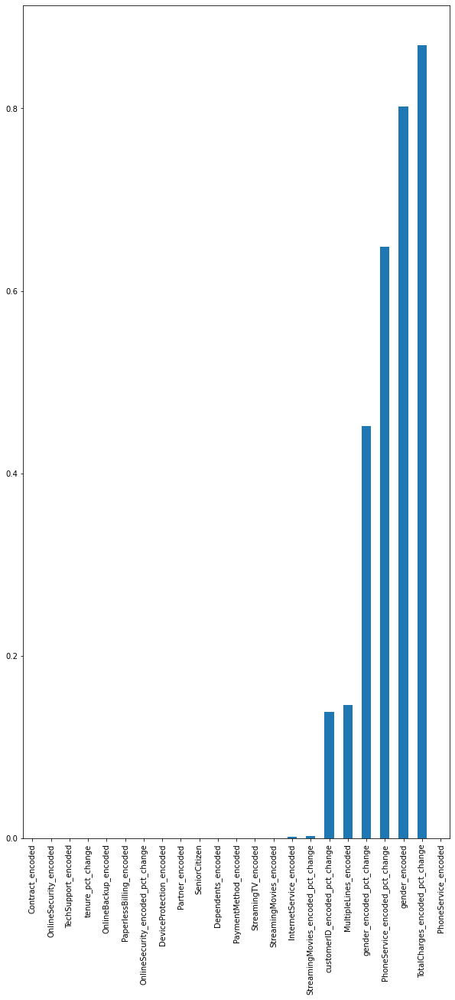

In [104]:
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))

# I have used these transformed values to generate pvalue of each feature (to explain label).

# Mathematical Notation

P Value = (sample proportion - Assumed population proportion in the null hypothesis)/(sqrt((Assumed population proportion in the null hypothesis * ( 1 - Assumed population proportion in the null hypothesis )) / n))

In [105]:
p_values=p_values[p_values<0.05]
p_values.index

Index(['Contract_encoded', 'OnlineSecurity_encoded', 'TechSupport_encoded',
       'tenure_pct_change', 'OnlineBackup_encoded', 'PaperlessBilling_encoded',
       'OnlineSecurity_encoded_pct_change', 'DeviceProtection_encoded',
       'Partner_encoded', 'SeniorCitizen', 'Dependents_encoded',
       'PaymentMethod_encoded', 'StreamingTV_encoded',
       'StreamingMovies_encoded', 'InternetService_encoded',
       'StreamingMovies_encoded_pct_change'],
      dtype='object')

# These features strongly impact attrition and control actions are required mainly on these to curb the problems around attrition.

# P Values are an important component of feature selection, with significance level set to 0.05, Variance Threshold
    ensemble technique returns with 95% confidence, all the features that have maximum explanatory capacity
For the present dataset features with pvalues with less than 0.05 are:
Index(['Contract_encoded', 'OnlineSecurity_encoded', 'TechSupport_encoded',
       'tenure_pct_change', 'OnlineBackup_encoded', 'PaperlessBilling_encoded',
       'OnlineSecurity_encoded_pct_change', 'DeviceProtection_encoded',
       'Partner_encoded', 'SeniorCitizen', 'Dependents_encoded',
       'PaymentMethod_encoded', 'StreamingTV_encoded',
       'StreamingMovies_encoded', 'InternetService_encoded',
       'StreamingMovies_encoded_pct_change'],
      dtype='object')

In [106]:
import numpy as np
x=x_frame1.copy()
x=x[['Contract_encoded', 'OnlineSecurity_encoded', 'TechSupport_encoded',
       'tenure_pct_change', 'OnlineBackup_encoded', 'PaperlessBilling_encoded',
       'OnlineSecurity_encoded_pct_change', 'DeviceProtection_encoded',
       'Partner_encoded', 'SeniorCitizen', 'Dependents_encoded',
       'PaymentMethod_encoded', 'StreamingTV_encoded',
       'StreamingMovies_encoded', 'InternetService_encoded',
       'StreamingMovies_encoded_pct_change']]
x.sample()

,Contract_encoded,OnlineSecurity_encoded,TechSupport_encoded,tenure_pct_change,OnlineBackup_encoded,PaperlessBilling_encoded,OnlineSecurity_encoded_pct_change,DeviceProtection_encoded,Partner_encoded,SeniorCitizen,Dependents_encoded,PaymentMethod_encoded,StreamingTV_encoded,StreamingMovies_encoded,InternetService_encoded,StreamingMovies_encoded_pct_change
4479,1.0,0.0,1.0,0.497348,0.0,0.0,0.512548,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.540402,0.518059


# The above table displays a sample of final x vector with features and values finally selected to be used for prediction.

In [107]:
y.sample()

3347    0.0
Name: Churn_encoded, dtype: float64

# The above series displays a sample of label.

In [108]:
x.shape, y.shape

((6005, 16), (6005,))

# The above cell displays final shapes of x and y vectors

In [109]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.6)

In [110]:
x_train.shape, y_train.shape

((2402, 16), (2402,))

# In the above two cells, I have divided final vectors with train test split technique, in which train data is 40% and test data is 60% to avoid overfitting issue.

# Model Development, Evaluation And Saving (Total Models = 10)

# Selection Reasoning Of Models 1 to 5

# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.

Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# The use case assigned revolves around uneven label points hence there is high probality of not achieving a good fit. Hence, I have tried different ensembele techniques that can lower variance and bias and help achieve good scores. (Just as a reminder, I have already applied variance threshold of 0.01 to ensure that risk of models is low). 

# The theories in the two cells above explain why I have chosen Model 1, Model 2, Model 3, Model 4 and Model 5 for this use case. Model 5 is support vector classifier and hence, is again a very powerful implementation to prevent illness of fit and make appropriate decision boundaries.

# Model 1

# Random Forest Classifier With Intuitional Hyper Parameter Tuning

In [101]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pickle
rfc=el(200, criterion='entropy', random_state=100, max_features='sqrt', min_weight_fraction_leaf=0.1, min_impurity_decrease=0.01, n_jobs=-1, warm_start=True, max_depth=30, max_leaf_nodes=10, ccp_alpha=1, oob_score=True, bootstrap=True)
rfc.fit(x_train, y_train)
model1_train_score=rfc.score(x_train, y_train)
model1_test_score=rfc.score(x_test, y_test)
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
cv_risk=scores.std()
y_pred=rfc.predict(x_train)
ytst_pred=rfc.predict(x_test)
model1_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred})
model1_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred})

In [102]:
model1_prediction_train

,y_train,yhat
2607,1.0,0.0
5639,0.0,0.0
2115,0.0,0.0
5805,0.0,0.0
2292,0.0,0.0
...,...,...
3066,0.0,0.0
1373,0.0,0.0
4587,0.0,0.0
7002,0.0,0.0


In [103]:
model1_prediction_test

,y_test,yhat
3743,1.0,0.0
3745,1.0,0.0
3084,0.0,0.0
2184,1.0,0.0
673,0.0,0.0
...,...,...
1603,1.0,0.0
6845,0.0,0.0
1915,0.0,0.0
6712,0.0,0.0


In [104]:
# Model 1 Metrics

In [105]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test,ytst_pred),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))
#Since risk is low model is low variance and since train score and test score are equivalent, model is low bias too.

Train Score:  0.73
Test Score:  0.73
Train Accuracy Score:  0.73
Test Accuracy Score:  0.73
Cross Validation Score:  0.73
Cross Validation Risk:  0.0


In [106]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test,ytst_pred))

              precision    recall  f1-score   support

         0.0       0.73      1.00      0.84      2620
         1.0       0.00      0.00      0.00       983

    accuracy                           0.73      3603
   macro avg       0.36      0.50      0.42      3603
weighted avg       0.53      0.73      0.61      3603



In [107]:
print(confusion_matrix(y_test,ytst_pred))

[[2620    0]
 [ 983    0]]


In [108]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred), 2)
    print(auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

0.5


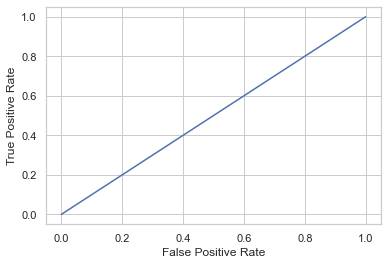

In [109]:
from sklearn import metrics
y_pred_proba =rfc.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


# Model 2

# Random Forest Classifier With Default Hyper Parameter Tuning

In [110]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
rfc1=el()
rfc1.fit(x_train, y_train)
model2_train_score=rfc1.score(x_train, y_train)
model2_test_score=rfc1.score(x_test, y_test)
scores1=cross_val_score(rfc1, x, y, cv=5)
cv_scores1=scores1.mean()
cv_risk1=scores1.std()
y_pred1=rfc1.predict(x_train)
ytst_pred1=rfc1.predict(x_test)
model2_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred1})
model2_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred1})

In [111]:
model2_prediction_train

,y_train,yhat
2607,1.0,1.0
5639,0.0,0.0
2115,0.0,0.0
5805,0.0,0.0
2292,0.0,0.0
...,...,...
3066,0.0,0.0
1373,0.0,0.0
4587,0.0,0.0
7002,0.0,0.0


In [112]:
model2_prediction_test

,y_test,yhat
3743,1.0,0.0
3745,1.0,1.0
3084,0.0,0.0
2184,1.0,1.0
673,0.0,0.0
...,...,...
1603,1.0,0.0
6845,0.0,1.0
1915,0.0,0.0
6712,0.0,0.0


In [113]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc1.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred1),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred1),2))
print('Cross Validation Score: ', np.round(cv_scores1,2))
print('Cross Validation Risk: ', np.round(cv_risk1,2))

Train Score:  1.0
Test Score:  0.77
Train Accuracy Score:  1.0
Test Accuracy Score:  0.77
Cross Validation Score:  0.76
Cross Validation Risk:  0.0


In [114]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred1))

              precision    recall  f1-score   support

         0.0       0.82      0.88      0.85      2620
         1.0       0.60      0.48      0.53       983

    accuracy                           0.77      3603
   macro avg       0.71      0.68      0.69      3603
weighted avg       0.76      0.77      0.76      3603



In [115]:
print(confusion_matrix(y_test, ytst_pred1))

[[2300  320]
 [ 512  471]]


In [116]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred1), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.68


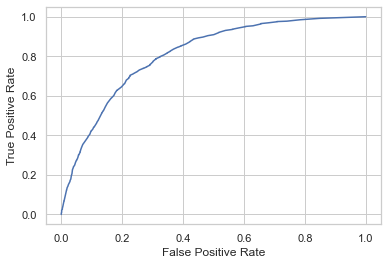

In [117]:
from sklearn import metrics
y_pred_proba =rfc1.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model 3

# RFC With Grid Search CV

In [119]:
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt
rfc2=el()
params = {
 'n_estimators': [50, 100],
 'max_features':['auto', 'sqrt', 'log2'],
 'criterion' : ['entropy', 'gini'],
 'bootstrap': [True, False],
 'oob_score':[True, False],
 'n_jobs':[None,-1],
 'warm_start':[True, False]
}
gridsearch=GridSearchCV(rfc2, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
best_parameters=gridsearch.best_params_
best_score=gridsearch.best_score_
best_estim=gridsearch.best_estimator_
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
ytst_pred2=best_estim.predict(x_test)
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2})
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2})

In [121]:
# Model 3 Predictions

In [122]:
model3_prediction_train

,y_train,yhat
2607,1.0,1.0
5639,0.0,0.0
2115,0.0,0.0
5805,0.0,0.0
2292,0.0,0.0
...,...,...
3066,0.0,0.0
1373,0.0,0.0
4587,0.0,0.0
7002,0.0,0.0


In [123]:
model3_prediction_test

,y_test,yhat
3743,1.0,0.0
3745,1.0,1.0
3084,0.0,0.0
2184,1.0,1.0
673,0.0,0.0
...,...,...
1603,1.0,0.0
6845,0.0,1.0
1915,0.0,0.0
6712,0.0,0.0


In [124]:
# Model 3 Metrics

In [125]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred2),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred2),2))

Train Score:  1.0
Test Score:  0.77
Train Accuracy Score:  1.0
Test Accuracy Score:  0.77


In [126]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'bootstrap': True, 'criterion': 'entropy', 'max_features': 'auto', 'n_estimators': 100, 'n_jobs': None, 'oob_score': True, 'warm_start': False}
0.7751784476784477


In [127]:
best_estim=gridsearch.best_estimator_
print(best_estim)

RandomForestClassifier(criterion='entropy', oob_score=True)


In [128]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred2))

print(confusion_matrix(y_test, ytst_pred2))

              precision    recall  f1-score   support

         0.0       0.82      0.88      0.85      2620
         1.0       0.60      0.50      0.54       983

    accuracy                           0.77      3603
   macro avg       0.71      0.69      0.70      3603
weighted avg       0.76      0.77      0.77      3603

[[2295  325]
 [ 494  489]]


In [129]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred2), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.69


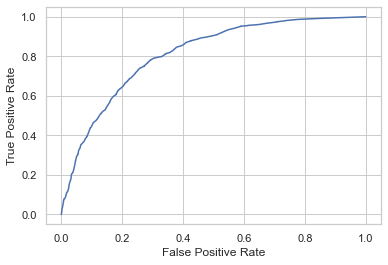

In [130]:
from sklearn import metrics
y_pred_proba =best_estim.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model 4

# Bagging Classifier With Grid Search CV Hyper Parameter Tuning

In [132]:
import sklearn
abreg1 = sklearn.ensemble.BaggingClassifier()
params = {
 'n_estimators': [50, 100],
 'bootstrap': [True, False],
 'random_state': [0,10,100,1000,10000,100000,100000],
 'oob_score': [True, False]
 }
gridsearch1=GridSearchCV(abreg1, params, cv=5, return_train_score=True)
gridsearch1.fit(x_train, y_train)
best_parameters1=gridsearch1.best_params_
best_score1=gridsearch1.best_score_
best_estim1=gridsearch1.best_estimator_
best_estim1.fit(x_train,y_train)
y_pred3=best_estim1.predict(x_train)
model4_train_score=best_estim1.score(x_train, y_train)
model4_test_score=best_estim1.score(x_test, y_test)
ytst_pred3=best_estim1.predict(x_test)
model4_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred3})
model4_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred3})

In [133]:
# Model 4 Predictions

In [134]:
model4_prediction_train

,y_train,yhat
2607,1.0,1.0
5639,0.0,0.0
2115,0.0,0.0
5805,0.0,0.0
2292,0.0,0.0
...,...,...
3066,0.0,0.0
1373,0.0,0.0
4587,0.0,0.0
7002,0.0,0.0


In [135]:
model4_prediction_test

,y_test,yhat
3743,1.0,0.0
3745,1.0,1.0
3084,0.0,0.0
2184,1.0,1.0
673,0.0,0.0
...,...,...
1603,1.0,0.0
6845,0.0,1.0
1915,0.0,0.0
6712,0.0,0.0


In [136]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim1.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred3),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred3),2))

Train Score:  1.0
Test Score:  0.76
Train Accuracy Score:  1.0
Test Accuracy Score:  0.76


In [137]:
print(gridsearch1.best_params_)
print(gridsearch1.best_score_)

{'bootstrap': True, 'n_estimators': 100, 'oob_score': True, 'random_state': 100000}
0.7622643797643798


In [138]:
best_estim=gridsearch1.best_estimator_
print(best_estim)

BaggingClassifier(n_estimators=100, oob_score=True, random_state=100000)


In [139]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred3))

              precision    recall  f1-score   support

         0.0       0.82      0.87      0.84      2620
         1.0       0.58      0.48      0.53       983

    accuracy                           0.76      3603
   macro avg       0.70      0.68      0.68      3603
weighted avg       0.75      0.76      0.76      3603



In [140]:
print(confusion_matrix(y_test, ytst_pred3))

[[2280  340]
 [ 510  473]]


In [141]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred3), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.68


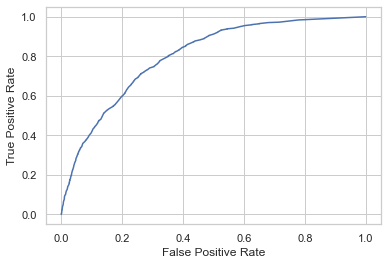

In [142]:
from sklearn import metrics
y_pred_proba =best_estim1.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model5

# Support Vector With Sigmoid

In [144]:
from sklearn import svm
clf = svm.SVC(kernel='sigmoid')
model5_prediction=clf.fit(x_train, y_train)
cross_scores=clf.score(x_train, y_train)
cross_risk=clf.score(x_test, y_test)

In [145]:
y_pred5=pd.DataFrame(clf.predict(x_train), columns=['yhat'])
print('Train Prediction\n')
y_pred5

Train Prediction



,yhat
0,1.0
1,0.0
2,1.0
3,0.0
4,1.0
...,...
2397,0.0
2398,0.0
2399,0.0
2400,1.0


In [146]:
ytst_pred5=pd.DataFrame(clf.predict(x_test), columns=['yhat'])
print('Test Prediction\n')
ytst_pred5

Test Prediction



,yhat
0,0.0
1,0.0
2,0.0
3,0.0
4,1.0
...,...
3598,0.0
3599,1.0
3600,0.0
3601,0.0


In [147]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(clf.score(x_train, y_train),2))
print('Test Score: ', np.round(clf.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred5),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred5),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.63
Test Score:  0.62
Train Accuracy Score:  0.63
Test Accuracy Score:  0.62
Cross Validation Score:  0.73
Cross Validation Risk:  0.0


In [148]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred5))

              precision    recall  f1-score   support

         0.0       0.74      0.74      0.74      2620
         1.0       0.31      0.31      0.31       983

    accuracy                           0.62      3603
   macro avg       0.52      0.52      0.52      3603
weighted avg       0.62      0.62      0.62      3603



In [149]:
print(confusion_matrix(y_test, ytst_pred5))

[[1937  683]
 [ 680  303]]


In [150]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred5), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.52


In [151]:
from sklearn import metrics
try:
    y_pred_proba =clf.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except AttributeError:
    print('Graph cannot be generated because probability is off for model development.')

Graph cannot be generated because probability is off for model development.


# Resampling, Rescaling And Re Feature Selection And Re Spliting For Model Optimization

# Reasoning Of Applying Resampling and developing models 6 to 10.

# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.
Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# Since, original y vector is highly unsampled, I will do resampling to balance both 1 and 0 data points to ensure that alongwith being low on variance, the model is also low on bias. Hence, I can achieve, bias variance trade off.

# Hence, I have developed models 6 to 10 based on rfc, ensemble and svm methods on resampled data

In [152]:
y.value_counts() #original y vector, value counts

0.0    4369
1.0    1636
Name: Churn_encoded, dtype: int64

0.0    3492
1.0    3492
Name: Churn_encoded, dtype: int64


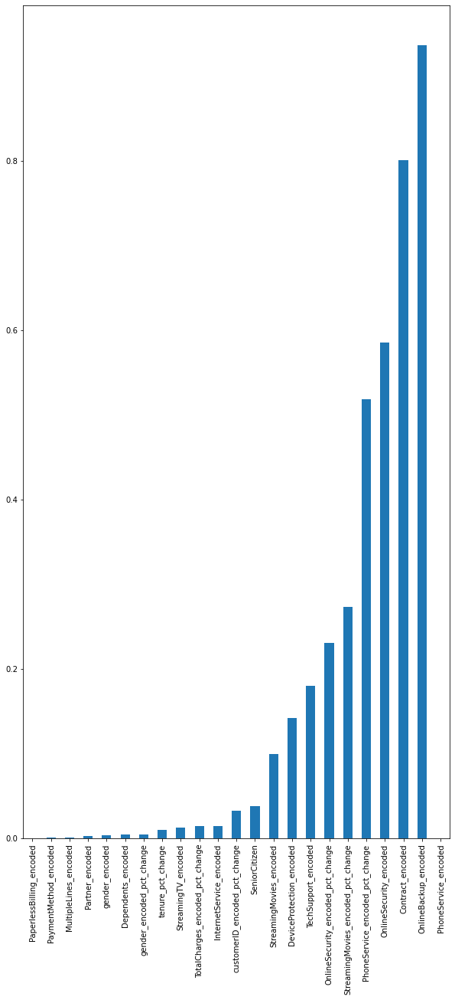

In [485]:
import numpy as np
from sklearn.utils import resample
x=x_frame11.copy()
y=final_dataframe['Churn_encoded']
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20)
X=pd.concat([x_train, y_train], axis=1)
not_good=X[X['Churn_encoded']==0]
good=X[X['Churn_encoded']==1]
good_upsampled=resample(good, replace=True, n_samples=len(not_good), random_state=0)
upsampled=pd.concat([not_good, good_upsampled])
x=upsampled.drop('Churn_encoded', axis=1)
y=upsampled['Churn_encoded']
x[np.isinf(x)] = 0
x[np.isnan(x)]=0
scale=MinMaxScaler([0,1])
scaled_data = scale.fit_transform(x)
scaled_frame=pd.DataFrame(scaled_data, columns=x.columns)
x=scaled_frame
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x,y,test_size=0.20)
print(upsampled['Churn_encoded'].value_counts())
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))
p_values=p_values[p_values<0.05]
p_values=pd.DataFrame(p_values, columns=['P Values'])
p_values['Features']=p_values.index
p_values=p_values[['Features', 'P Values']]
x=x[p_values['Features']]
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20)

# The above matrix represent balanced label vector with 1105 data points for 0 and 1105 data points for 1. And the graph shoows new set of strong indicators based on p values, with variance threshold as low as 0.01 and comfidence as 95%.

In [486]:
p_values

,Features,P Values
PaperlessBilling_encoded,PaperlessBilling_encoded,0.000004
PaymentMethod_encoded,PaymentMethod_encoded,0.000852
MultipleLines_encoded,MultipleLines_encoded,0.001285
Partner_encoded,Partner_encoded,0.002576
gender_encoded,gender_encoded,0.004036
Dependents_encoded,Dependents_encoded,0.004403
gender_encoded_pct_change,gender_encoded_pct_change,0.004883
tenure_pct_change,tenure_pct_change,0.009677
StreamingTV_encoded,StreamingTV_encoded,0.012959
TotalCharges_encoded_pct_change,TotalCharges_encoded_pct_change,0.014203


In [487]:
x_train.sample()

,PaperlessBilling_encoded,PaymentMethod_encoded,MultipleLines_encoded,Partner_encoded,gender_encoded,Dependents_encoded,gender_encoded_pct_change,tenure_pct_change,StreamingTV_encoded,TotalCharges_encoded_pct_change,InternetService_encoded,customerID_encoded_pct_change,SeniorCitizen
4847,1.0,0.340462,0.0,0.0,0.0,1.0,0.499592,0.34729,1.0,0.30964,0.0,0.216173,0.0


In [488]:
y_train.sample()

631    0.0
Name: Churn_encoded, dtype: float64

# Model 6

# RFC On Resampled Data With Intuitional Hyper Parameter Tuning

In [489]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pickle
rfc=el(200, criterion='entropy', random_state=100, max_features='sqrt', min_weight_fraction_leaf=0.1, min_impurity_decrease=0.01, n_jobs=-1, warm_start=True, max_depth=30, max_leaf_nodes=10, ccp_alpha=1, oob_score=True, bootstrap=True)
rfc.fit(x_train, y_train)
model1_train_score=rfc.score(x_train, y_train)
model1_test_score=rfc.score(x_test, y_test)
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
cv_risk=scores.std()
y_pred=rfc.predict(x_train)
ytst_pred=rfc.predict(x_test)
model1_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred})
model1_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred})

In [490]:
model1_prediction_train

,y_train,yhat
1052,0.0,0.0
6234,0.0,0.0
855,1.0,0.0
4226,1.0,0.0
4079,0.0,0.0
...,...,...
3262,1.0,0.0
1273,0.0,0.0
3528,1.0,0.0
4395,1.0,0.0


In [491]:
model1_prediction_test

,y_test,yhat
3158,1.0,0.0
6201,0.0,0.0
2260,1.0,0.0
1076,0.0,0.0
1236,1.0,0.0
...,...,...
816,1.0,0.0
1791,0.0,0.0
4997,1.0,0.0
4385,0.0,0.0


In [492]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.5
Test Score:  0.5
Train Accuracy Score:  0.5
Test Accuracy Score:  0.5
Cross Validation Score:  0.5
Cross Validation Risk:  0.0


In [493]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred))
print(confusion_matrix(y_test, ytst_pred))

              precision    recall  f1-score   support

         0.0       0.50      1.00      0.67       697
         1.0       0.00      0.00      0.00       700

    accuracy                           0.50      1397
   macro avg       0.25      0.50      0.33      1397
weighted avg       0.25      0.50      0.33      1397

[[697   0]
 [700   0]]


In [494]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.5


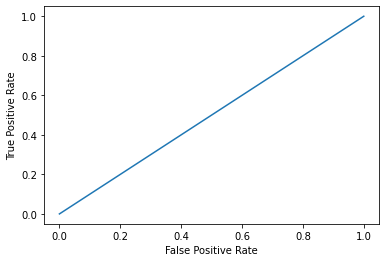

In [495]:
from sklearn import metrics
try:
    y_pred_proba =rfc.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except IndexError as err:
    print(err)

# Model 7

# RFC On Resampled Data With Default Hyper Parameter Tuning

In [496]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
rfc1=el()
rfc1.fit(x_train, y_train)
model2_train_score=rfc1.score(x_train, y_train)
model2_test_score=rfc1.score(x_test, y_test)
scores1=cross_val_score(rfc1, x, y, cv=5)
cv_scores1=scores1.mean()
cv_risk1=scores1.std()
y_pred1=rfc1.predict(x_train)
ytst_pred1=rfc1.predict(x_test)
model2_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred1})
model2_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred1})

In [497]:
y_pred1

array([0., 1., 1., ..., 1., 1., 0.])

In [498]:
ytst_pred1

array([1., 1., 1., ..., 1., 0., 0.])

In [499]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc1.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred1),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred1),2))
print('Cross Validation Score: ', np.round(cv_scores1,2))
print('Cross Validation Risk: ', np.round(cv_risk1,2))

Train Score:  0.85
Test Score:  0.79
Train Accuracy Score:  0.85
Test Accuracy Score:  0.79
Cross Validation Score:  0.77
Cross Validation Risk:  0.1


In [500]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred1))

print(confusion_matrix(y_test, ytst_pred1))

              precision    recall  f1-score   support

         0.0       0.91      0.64      0.75       697
         1.0       0.72      0.94      0.82       700

    accuracy                           0.79      1397
   macro avg       0.82      0.79      0.78      1397
weighted avg       0.82      0.79      0.78      1397

[[446 251]
 [ 45 655]]


In [501]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred1), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.79


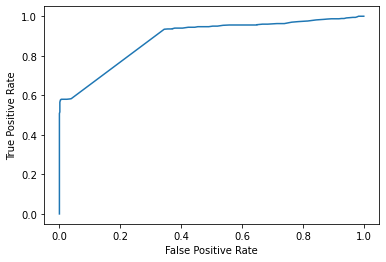

In [502]:
from sklearn import metrics
try:
    y_pred_proba =rfc1.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except IndexError as err:
    print(err)

# Model8

# RFC With Grid Search CV On Resampled Data

In [504]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt
import pickle
rfc2=el()
params = {
 'n_estimators': [50, 100],
 'max_features':['auto', 'sqrt', 'log2'],
 'criterion' : ['entropy', 'gini'],
 'bootstrap': [True, False],
 'oob_score':[True, False],
 'n_jobs':[None,-1],
 'warm_start':[True, False]
}
gridsearch=GridSearchCV(rfc2, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
best_parameters=gridsearch.best_params_
best_score=gridsearch.best_score_
best_estim=gridsearch.best_estimator_
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
ytst_pred2=best_estim.predict(x_test)
model3_save=pickle.dumps(best_estim)  # saving the best model
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2}) # Model 8 train prediction
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2}) # Model 8 test prediction

In [505]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred2),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred2),2))

Train Score:  0.85
Test Score:  0.8
Train Accuracy Score:  0.85
Test Accuracy Score:  0.8


In [506]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'bootstrap': False, 'criterion': 'gini', 'max_features': 'log2', 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'warm_start': True}
0.7522827404737005


In [507]:
best_estim=gridsearch.best_estimator_
print(best_estim)

RandomForestClassifier(bootstrap=False, max_features='log2', warm_start=True)


In [508]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred2))

print(confusion_matrix(y_test, ytst_pred2))

              precision    recall  f1-score   support

         0.0       0.91      0.67      0.77       697
         1.0       0.74      0.93      0.82       700

    accuracy                           0.80      1397
   macro avg       0.82      0.80      0.80      1397
weighted avg       0.82      0.80      0.80      1397

[[464 233]
 [ 47 653]]


In [509]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred2), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.8


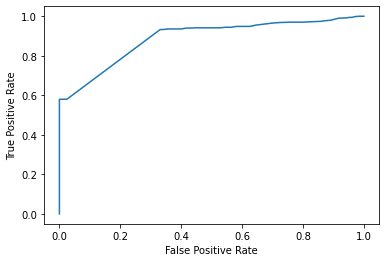

In [510]:
from sklearn import metrics
try:
    y_pred_proba =best_estim.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except IndexError as err:
    print(err)

In [511]:
best_model1=pickle.dumps(best_estim) #saving the model

# Model 9

# Bagging Classifier With Grid Searh CV Hyper Parameter Tuning On Resampled Data

In [512]:
import sklearn
abreg1 = sklearn.ensemble.BaggingClassifier()
params = {
 'n_estimators': [50, 100],
 'bootstrap': [True, False],
 'random_state': [0,10,100,1000,10000,100000,100000],
 'oob_score': [True, False]
 }
gridsearch1=GridSearchCV(abreg1, params, cv=5, return_train_score=True)
gridsearch1.fit(x_train, y_train)
best_parameters1=gridsearch1.best_params_
best_score1=gridsearch1.best_score_
best_estim1=gridsearch1.best_estimator_
best_estim1.fit(x_train,y_train)
y_pred3=best_estim1.predict(x_train)
model4_train_score=best_estim1.score(x_train, y_train)
model4_test_score=best_estim1.score(x_test, y_test)
ytst_pred3=best_estim1.predict(x_test)
model4_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred3})
model4_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred3})

In [513]:
model4_prediction_train

,y_train,yhat
1052,0.0,0.0
6234,0.0,1.0
855,1.0,1.0
4226,1.0,1.0
4079,0.0,0.0
...,...,...
3262,1.0,1.0
1273,0.0,0.0
3528,1.0,1.0
4395,1.0,1.0


In [514]:
model4_prediction_test

,y_test,yhat
3158,1.0,1.0
6201,0.0,1.0
2260,1.0,1.0
1076,0.0,0.0
1236,1.0,1.0
...,...,...
816,1.0,1.0
1791,0.0,0.0
4997,1.0,1.0
4385,0.0,0.0


In [515]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim1.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred3),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred3),2))

Train Score:  0.85
Test Score:  0.78
Train Accuracy Score:  0.85
Test Accuracy Score:  0.78


In [516]:
print(gridsearch1.best_params_)
print(gridsearch1.best_score_)

{'bootstrap': True, 'n_estimators': 100, 'oob_score': True, 'random_state': 10000}
0.7354602716514815


In [517]:
best_estim=gridsearch1.best_estimator_
print(best_estim)

BaggingClassifier(n_estimators=100, oob_score=True, random_state=10000)


In [518]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred3), 2)
    print('auc: ',auc)
except ValueError as err:
    print(err)

auc:  0.78


In [519]:
y_train.unique()

array([0., 1.])

In [520]:
y_test.unique()

array([1., 0.])

In [521]:
y.unique()

array([0., 1.])

In [522]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred3))
print(confusion_matrix(y_test, ytst_pred3))

              precision    recall  f1-score   support

         0.0       0.90      0.63      0.74       697
         1.0       0.72      0.93      0.81       700

    accuracy                           0.78      1397
   macro avg       0.81      0.78      0.78      1397
weighted avg       0.81      0.78      0.78      1397

[[439 258]
 [ 47 653]]


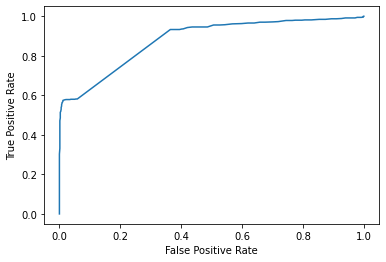

In [523]:
from sklearn import metrics
y_pred_proba =best_estim1.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model 10

# Support Vector Classifier with sigmoid to prevent overfitting on resampled data

In [524]:
from sklearn import svm
clf = svm.SVC(kernel='sigmoid')
model5_prediction=clf.fit(x_train, y_train)
cross_scores=clf.score(x_train, y_train)
cross_risk=clf.score(x_test, y_test)

In [525]:
y_pred5=clf.predict(x_train)
y_pred5

array([1., 0., 1., ..., 0., 0., 1.])

In [526]:
ytst_pred5=clf.predict(x_test)
ytst_pred5

array([1., 0., 1., ..., 0., 0., 1.])

In [527]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(clf.score(x_train, y_train),2))
print('Test Score: ', np.round(clf.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train,y_pred5),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test,ytst_pred5),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.51
Test Score:  0.5
Train Accuracy Score:  0.51
Test Accuracy Score:  0.5
Cross Validation Score:  0.5
Cross Validation Risk:  0.0


In [528]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test,ytst_pred5))
print(confusion_matrix(y_test,ytst_pred5))

              precision    recall  f1-score   support

         0.0       0.50      0.64      0.56       697
         1.0       0.51      0.37      0.42       700

    accuracy                           0.50      1397
   macro avg       0.50      0.50      0.49      1397
weighted avg       0.50      0.50      0.49      1397

[[448 249]
 [444 256]]


In [529]:
from sklearn import metrics
try:
    y_pred_proba =clf.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except AttributeError:
    print('Graph cannot be generated because probability is turned off for model development.')

Graph cannot be generated because probability is turned off for model development.


# Best model is saved in pickle for production

# Conclusion
# Best model is Model 8 with auc=0.80

Model 8 rfc with grid search on resampled data

Train Score:  0.85

Test Score:  0.8

Train Accuracy Score:  0.85

Test Accuracy Score:  0.8

              precision    recall  f1-score   support

    0.0       0.91      0.67      0.77       697

    1.0       0.74      0.93      0.82       700


    accuracy                           0.80      1397

    macro avg       0.82      0.80      0.80      1397

weighted avg       0.82      0.80      0.80      1397

[[464 233]

[ 47 653]]

auc:0.8

Please note, metrics calculation is explained above while development and evaluation.

# Credits:
DataTrained and Python Documentations.